For an up-to-date version / full view of the plotly - plots, please, go to

https://drive.google.com/file/d/1AHyrLrllFVvihJ8whsjO9FrOlKEHkdd5/view?usp=sharing

Looker report on wins, goals, and top scorers: https://lookerstudio.google.com/s/rfCBA74X9nI

In [ ]:
%%capture
! pip install -q kaggle
! pip install -q pingouin


In [ ]:
import numpy as np
import pandas as pd
import sqlite3
import duckdb
import re

import sys
import os
import warnings
#from importlib import reload


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from xml.etree.ElementTree import fromstring, ElementTree
import xml.etree.ElementTree as ET

import scipy.stats as stats
import statsmodels.api as sm
#import statsmodels.formula.api as smf
#import statsmodels.stats.api as sms
import pingouin as pg


from sklearn.preprocessing import StandardScaler
#from sklearn_pandas import DataFrameMapper
#from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.sandbox.predict_functional import predict_functional
#from statsmodels.stats.weightstats import DescrStatsW

#from sklearn.model_selection import cross_val_score, cross_val_predict, cross_validate
from sklearn.feature_selection import RFECV, RFE
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RepeatedKFold, StratifiedKFold

#from sklearn import metrics
from sklearn.metrics import accuracy_score, mean_squared_error
#from sklearn.metrics import confusion_matrix


from sklearn.base import BaseEstimator, RegressorMixin

from datetime import datetime


from google.colab import drive
drive.mount("/content/gdrive")

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
#pd.reset_option('display.max_rows')

Mounted at /content/gdrive


In [ ]:
home_folder = '/content/gdrive/MyDrive/Colab Notebooks/Portfolio/DA_Football/'

In [ ]:
os.mkdir(home_folder+'products/')

### Functions

The Python-file with the functions is at
https://drive.google.com/file/d/1AvGxF5nqZtUuam9zMWlcCZHgW-iplPXu/view?usp=sharing


In [ ]:
sys.path.append(home_folder)
from footballfunc import *

#reload(footballfunc)

In [ ]:
help(corrplot)   # are functions loaded? else crash

Help on function corrplot in module footballfunc:

corrplot(corr, abs_cut_off=0.2, fontsize=10, title='')
    simple correlation plot:
    corr = df.corr()
    abs_cut_off = blend all values below this absolute value
    fontsize = .. of the annotations on top of the color tiles
    title ---> plot will show 'Correlations ' + your title, e.g. 'of Features'



In [ ]:
! pip freeze > /content/gdrive/MyDrive/Colab\ Notebooks/Portfolio/DA_Football/requirements.txt

# 1. Load and Update Data

In [ ]:
#%load_ext lab_black
%%capture

! mkdir ~/.kaggle
! cp /content/gdrive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d prajitdatta/ultimate-25k-matches-football-database-european
! unzip -o ultimate-25k-matches-football-database-european

In [ ]:
#db = sqlite3.connect("/content/gdrive/MyDrive/Colab Notebooks/database.sqlite")

In [ ]:
db = sqlite3.connect("database.sqlite")

Let's inspect the tables inside the football data.

In [ ]:
tables = '''
        SELECT * from sqlite_master WHERE type='table'
        '''

F_tables = pd.read_sql_query(tables, db)
print('The podcast database contains the tables: \n')
F_tables['name']

The podcast database contains the tables: 



,name
0,sqlite_sequence
1,Player_Attributes
2,Player
3,Match
4,League
5,Country
6,Team
7,Team_Attributes


### Inspection: What is in which table?

#### SQL Tables Overview - Features, datatypes, missing values

notnull = 0 --> expect Nan

In [ ]:
for name in F_tables['name'].values:

    query = '''PRAGMA table_info({})'''
    query_rows = ''' SELECT count() AS entires FROM {} '''
    table = pd.read_sql_query(query.format(name), db)
    rows_table = pd.read_sql_query(query_rows.format(name), db)

    nulls_list = []
    for feature in table.name:

        query_null = 'SELECT count() AS counts FROM '+str(name)+' WHERE '+str(feature)+' IS NULL'
        nulls_table = pd.read_sql_query(query_null, db)
        null_numbers = nulls_table.counts[0]
        nulls_list.append(null_numbers)

    table['# NaN'] = nulls_list
    print('\n\n ################   ', name, ' (', len(table), 'features with',  rows_table.values[0][0], 'entries )  ###############\n')
    bunch = 50
    if len(table) > bunch:
        for i in range(0, int(len(table)/bunch)):
            print(table[i * bunch : (i+1) * bunch])
        print(table[(i+1) * bunch : ])
    else:
        print(table)
    print('')
    print(table.name.values)




 ################    sqlite_sequence  ( 2 features with 7 entries )  ###############

   cid  name type  notnull dflt_value  pk  # NaN
0    0  name             0       None   0      0
1    1   seq             0       None   0      0

['name' 'seq']


 ################    Player_Attributes  ( 42 features with 183978 entries )  ###############

    cid                 name     type  notnull dflt_value  pk  # NaN
0     0                   id  INTEGER        0       None   1      0
1     1   player_fifa_api_id  INTEGER        0       None   0      0
2     2        player_api_id  INTEGER        0       None   0      0
3     3                 date     TEXT        0       None   0      0
4     4       overall_rating  INTEGER        0       None   0    836
5     5            potential  INTEGER        0       None   0    836
6     6       preferred_foot     TEXT        0       None   0    836
7     7  attacking_work_rate     TEXT        0       None   0   3230
8     8  defensive_work_rate    

#### SQL Tables Summary


**sqlite_sequence  ( 2 features with 7 entries )**
* 'name' 'seq'

.

**Player_Attributes  ( 42 features with 183978 entries )**
* 'id' 'player_fifa_api_id' 'player_api_id' 'date'
* **attributes**: 'overall_rating'
 'potential' 'preferred_foot' 'attacking_work_rate' 'defensive_work_rate'
 'crossing' 'finishing' 'heading_accuracy' 'short_passing' 'volleys'
 'dribbling' 'curve' 'free_kick_accuracy' 'long_passing' 'ball_control'
 'acceleration' 'sprint_speed' 'agility' 'reactions' 'balance'
 'shot_power' 'jumping' 'stamina' 'strength' 'long_shots' 'aggression'
 'interceptions' 'positioning' 'vision' 'penalties' 'marking'
 'standing_tackle' 'sliding_tackle'
* **goal keeping attributes**: 'gk_diving' 'gk_handling' 'gk_kicking'
 'gk_positioning' 'gk_reflexes'
* **missing values**:

|  | features            | missing values |
|--|---------------------|--------------|
|  | attributes other than ids or date | 836 |
|  | attacking_work_rate | 3230 |
|  | volleys, curve, agility, balance  | 2713 |
|  | jumping, vision, sliding_tackle | 2713 |

* **non-numeric data type, i.e. text**: 'date' 'preferred_foot' 'attacking_work_rate' 'defensive_work_rate'

.

**Player  ( 7 features with 11060 entries )**
* 'id' 'player_api_id' 'player_name' 'player_fifa_api_id' 'birthday'
 'height' 'weight'
* **non-numeric data type, i.e. text**:
player_name
birthday

.

**Match  ( 115 features with 25979 entries )**
* 'id' 'country_id' 'league_id' 'season' 'stage' 'date' 'match_api_id'
 'home_team_api_id' 'away_team_api_id' 'home_team_goal' 'away_team_goal'
* **player and positions**: 'home/away_player_i/Xi/Yi'
* **match documentation in XML data**: 'goal' 'shoton' 'shotoff' 'foulcommit' 'card' 'cross' 'corner' 'possession'
* **betting odds**:  'B365H' -  'BSA'
* **missing values**:

|  | features            | missing values |
|--|---------------------|--------------|
|  | home/away_player positions | 1821 - 1839 |
|  | home/away_player ids | 1227 - 1554 |
|  | goal - possession | 11762 |
|  | B365H - BSA | 3423 - 14811 |

* **non-numeric data type, i.e. text**:
season, date, XML-features

.

**League  ( 3 features with 11 entries )**
* 'id' 'country_id' 'name'
* **non-numeric data type, i.e. text**:
name

.

**Country  ( 2 features with 11 entries )**
* 'id' 'name'
* **non-numeric data type, i.e. text**:
name

.

**Team  ( 5 features with 299 entries )**
* 'id' 'team_api_id' 'team_fifa_api_id' 'team_long_name' 'team_short_name'
* **non-numeric data type, i.e. text**:
team_long_name, team_short_name

.

**Team_Attributes  ( 25 features with 1458 entries )**
* 'id' 'team_fifa_api_id' 'team_api_id' 'date'
* **'buildUpPlay- (incl. -Class)**:
Speed', Dribbling', Passing', PositioningClass'
* **'chanceCreation- (incl. -Class)**:
Passing', Crossing', Shooting', PositioningClass'
* **'defence- (incl. -Class)**:
Pressure', Aggression', TeamWidth', DefenderLineClass'
* **missing values**:

|  | features            | missing values |
|--|---------------------|--------------|
|  | buildUpPlayDribbling | 969 |

* **non-numeric data type, i.e. text**:
date,
Class-version of attributes

In [ ]:
sqlite_sequence = '''
          SELECT *
          FROM sqlite_sequence
         '''
F_sqlite_sequence = pd.read_sql_query(sqlite_sequence, db)
F_sqlite_sequence[:10]

,name,seq
0,Team,103916
1,Country,51958
2,League,51958
3,Match,51958
4,Player,11075
5,Player_Attributes,183978
6,Team_Attributes,1458


# EDA

EDA - Overview:



EDA - Questions
* Which leagues are in which countries?
* Which leagues score the most/fewest goals?
* Who are the top scorers in each team and league?
* Is there such a thing as home advantage?

Modelling:
* Can we predict how many goals each team will score in each match?
* Can we predict which team will win the match?


### Country/League Overview

#### QUESTION: Which leagues are in which countries?


In [ ]:
Country = '''
          SELECT c.name as country_name,
                 l.name as league_name,
                 c.id as country_id,
                 l.id as league_id,
                 l.country_id as league_country_id

          FROM Country c
          JOIN League l
          ON c.id = l.country_id
         '''
F_Country = pd.read_sql_query(Country, db)

print('\nCountries and their Leagues in this dataset:\n')
F_Country


Countries and their Leagues in this dataset:



,country_name,league_name,country_id,league_id,league_country_id
0,Belgium,Belgium Jupiler League,1,1,1
1,England,England Premier League,1729,1729,1729
2,France,France Ligue 1,4769,4769,4769
3,Germany,Germany 1. Bundesliga,7809,7809,7809
4,Italy,Italy Serie A,10257,10257,10257
5,Netherlands,Netherlands Eredivisie,13274,13274,13274
6,Poland,Poland Ekstraklasa,15722,15722,15722
7,Portugal,Portugal Liga ZON Sagres,17642,17642,17642
8,Scotland,Scotland Premier League,19694,19694,19694
9,Spain,Spain LIGA BBVA,21518,21518,21518


The features '*id' have the same values in both tables, i.e instead of linking the league to a league_id we can alternatively link the country to the league_id.

In [ ]:
locs = list(F_Country.country_name.values)
locs = list(map(lambda x: x.replace('England', 'UK'), locs))

fig = px.choropleth(locations= locs, color= locs, locationmode='country names')

fig.update_layout(width = 600,
                  title=dict(text='Countries in the football dataset'),
                  geo=dict(scope='europe')
                  )

fig.update_geos(fitbounds="locations")

fig.show()

We see that the data comprises mostly Western-European countries.

### Player Overview

In [ ]:
Player = '''
          SELECT *
          FROM Player
         '''
F_Player = pd.read_sql_query(Player, db)
F_Player.drop(['id', 'player_fifa_api_id'], axis=1, inplace=True)
F_Player[:10]

,player_api_id,player_name,birthday,height,weight
0,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187
1,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146
2,162549,Aaron Doran,1991-05-13 00:00:00,170.18,163
3,30572,Aaron Galindo,1982-05-08 00:00:00,182.88,198
4,23780,Aaron Hughes,1979-11-08 00:00:00,182.88,154
5,27316,Aaron Hunt,1986-09-04 00:00:00,182.88,161
6,564793,Aaron Kuhl,1996-01-30 00:00:00,172.72,146
7,30895,Aaron Lennon,1987-04-16 00:00:00,165.10,139
8,528212,Aaron Lennox,1993-02-19 00:00:00,190.50,181
9,101042,Aaron Meijers,1987-10-28 00:00:00,175.26,170


#### NaN/Duplicate Check

In [ ]:
nan_type_overview(F_Player)

,Nan?,#Nan,type
player_api_id,False,0,int64
player_name,False,0,object
birthday,False,0,object
height,False,0,float64
weight,False,0,int64


In [ ]:
df = F_Player
df[df[['player_api_id', 'player_name']].duplicated() == True]  # find duplicate rows

,player_api_id,player_name,birthday,height,weight


No NaNs or duplicates in the Player table.

#### Histograms and Correlations

In [ ]:
target_date = datetime(2016, 5, 25)
df['age_2016'] = (target_date - pd.to_datetime(df['birthday'], errors='coerce')).dt.days / 365.

In [ ]:
F_Player[:5]

,player_api_id,player_name,birthday,height,weight,age_2016
0,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,24.252055
1,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.460274
2,162549,Aaron Doran,1991-05-13 00:00:00,170.18,163,25.052055
3,30572,Aaron Galindo,1982-05-08 00:00:00,182.88,198,34.071233
4,23780,Aaron Hughes,1979-11-08 00:00:00,182.88,154,36.569863


In [ ]:
F_Player.describe().round(1)

,player_api_id,height,weight,age_2016
count,11060.0,11060.0,11060.0,11060.0
mean,156582.4,181.9,168.4,29.3
std,160713.7,6.4,15.0,5.5
min,2625.0,157.5,117.0,17.1
25%,35555.5,177.8,159.0,25.1
50%,96619.5,182.9,168.0,28.9
75%,212470.5,185.4,179.0,33.2
max,750584.0,208.3,243.0,49.4


In [ ]:
df=F_Player
cols = list(df.columns[-3:])

In [ ]:
quick_histogram(df, cols, cols, bins=[20,20,40], ranges_x=None)

In [ ]:
F_Player_corr = F_Player[['height', 'weight', 'age_2016']].corr().round(2)

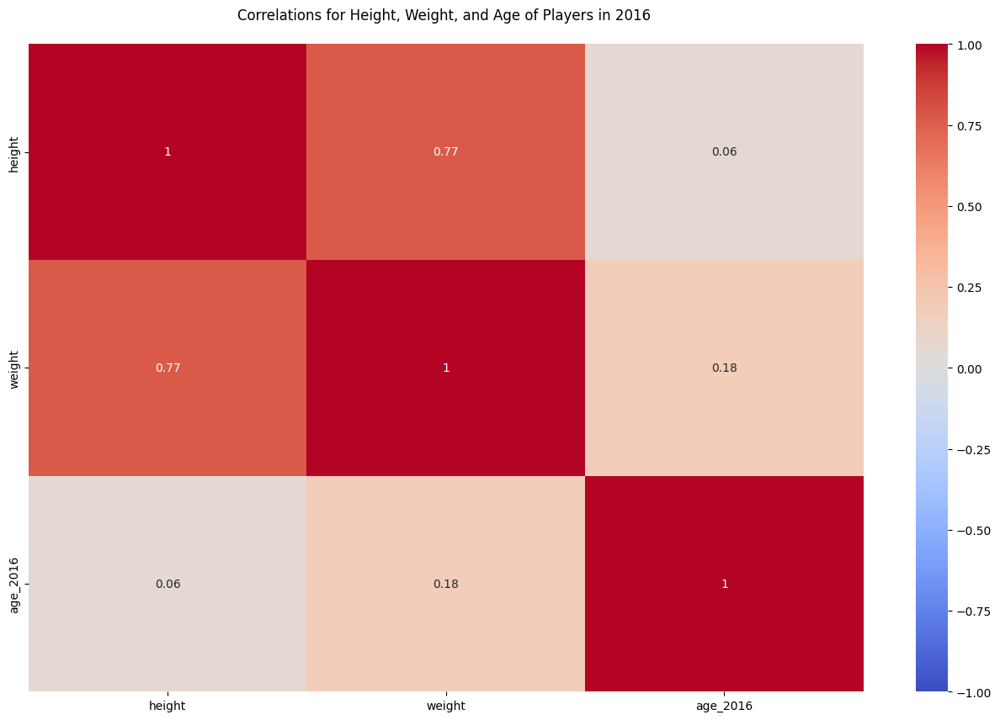

In [ ]:
corrplot(F_Player_corr, abs_cut_off = 0., fontsize = 10, title = 'for Height, Weight, and Age of Players in 2016')

### Player Attributes Overview

In [ ]:
Player_Attributes = '''
          SELECT *
          FROM Player_Attributes
         '''
F_Player_Attributes = pd.read_sql_query(Player_Attributes, db)
F_Player_Attributes.drop(['id','player_fifa_api_id'], axis=1, inplace=True)
F_Player_Attributes[:5]

,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,505942,2016-02-18 00:00:00,67.0,71.0,right,medium,medium,49.0,44.0,71.0,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
1,505942,2015-11-19 00:00:00,67.0,71.0,right,medium,medium,49.0,44.0,71.0,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
2,505942,2015-09-21 00:00:00,62.0,66.0,right,medium,medium,49.0,44.0,71.0,...,54.0,48.0,65.0,66.0,69.0,6.0,11.0,10.0,8.0,8.0
3,505942,2015-03-20 00:00:00,61.0,65.0,right,medium,medium,48.0,43.0,70.0,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0
4,505942,2007-02-22 00:00:00,61.0,65.0,right,medium,medium,48.0,43.0,70.0,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0


#### NaN/Duplicate Check

In [ ]:
#too long here - covered in 'SQL Tables Overview'
#nan_type_overview(F_Player_Attributes)

In [ ]:
df = F_Player_Attributes
df[df[['player_api_id', 'date', 'overall_rating', 'potential']].duplicated() == True]  # find duplicate rows

,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
84924,32968,2007-02-22 00:00:00,NaN,NaN,None,None,None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.loc[(df.player_api_id == 32968) & (df.date == '2007-02-22 00:00:00')]

,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
84698,32968,2007-02-22 00:00:00,74.0,76.0,right,None,3,52.0,77.0,64.0,...,62.0,67.0,22.0,24.0,44.0,20.0,20.0,24.0,12.0,19.0
84923,32968,2007-02-22 00:00:00,NaN,NaN,None,None,None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
84924,32968,2007-02-22 00:00:00,NaN,NaN,None,None,None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Reminder on **missing values**:

|  | features            | missing values |
|--|---------------------|--------------|
|  | attributes other than ids or date | 836 |
|  | attacking_work_rate | 3230 |
|  | volleys, curve, agility, balance  | 2713 |
|  | jumping, vision, sliding_tackle | 2713 |

 The Player Attributes table has one duplicated player id: 32968. One of these rows contains information, the other two only NaNs. Furthermore, the data is before the dates in the matches table. Either by excluding NaNs or reducing the timerange selection to the match table's, these duplicate entries mean no harm.


#### Pie Charts for Categorical Features

In [ ]:
df = F_Player_Attributes
df.loc[(~(df.attacking_work_rate.isin(['medium', 'high', 'low']))
            ), 'attacking_work_rate']='Other'

df.loc[(~(df.defensive_work_rate.isin(['medium', 'high', 'low']))
            ), 'defensive_work_rate']='Other'

In [ ]:
cat_features = ['preferred_foot', 'attacking_work_rate', 'defensive_work_rate']
df = F_Player_Attributes
titles = cat_features

for feature, title in zip(cat_features, titles):
    quick_pie(df, feature, rank_lvl=0, show_other=False, title=title)

3/4 of the Player prefer the right foot and 70% of the player show a medium attacking_ and defensive_work_rate. High work_rates are rather seen for attack (23%) thand for defense (15%).

#### Histograms and Correlations

##### Preparation

Let's add the Player table to the Player Attributes to combine all player properties

In [ ]:
F_Player_combine = F_Player.merge(F_Player_Attributes,
                                    left_on = 'player_api_id',
                                    right_on='player_api_id',
                                    how = 'outer')

F_Player_Attributes = F_Player_combine
F_Player_Attributes[-5:]


,player_api_id,player_name,birthday,height,weight,age_2016,date,overall_rating,potential,preferred_foot,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
183973,39902,Zvjezdan Misimovic,1982-06-05 00:00:00,180.34,176,33.994521,2009-08-30 00:00:00,83.0,85.0,right,...,88.0,83.0,22.0,31.0,30.0,9.0,20.0,84.0,20.0,20.0
183974,39902,Zvjezdan Misimovic,1982-06-05 00:00:00,180.34,176,33.994521,2009-02-22 00:00:00,78.0,80.0,right,...,88.0,70.0,32.0,31.0,30.0,9.0,20.0,73.0,20.0,20.0
183975,39902,Zvjezdan Misimovic,1982-06-05 00:00:00,180.34,176,33.994521,2008-08-30 00:00:00,77.0,80.0,right,...,88.0,70.0,32.0,31.0,30.0,9.0,20.0,73.0,20.0,20.0
183976,39902,Zvjezdan Misimovic,1982-06-05 00:00:00,180.34,176,33.994521,2007-08-30 00:00:00,78.0,81.0,right,...,88.0,53.0,28.0,32.0,30.0,9.0,20.0,73.0,20.0,20.0
183977,39902,Zvjezdan Misimovic,1982-06-05 00:00:00,180.34,176,33.994521,2007-02-22 00:00:00,80.0,81.0,right,...,88.0,53.0,38.0,32.0,30.0,9.0,9.0,78.0,7.0,15.0


Translate the birthday to age at the given date in the Player Attributes table to investigate the age distribution:

In [ ]:
df = F_Player_Attributes
df['age_2016'] = (pd.to_datetime(df['date']) - pd.to_datetime(df['birthday'], errors='coerce')).dt.days / 365.
df.rename(columns={'age_2016': 'age_season'}, inplace=True)
df[:10]

,player_api_id,player_name,birthday,height,weight,age_season,date,overall_rating,potential,preferred_foot,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.986301,2016-02-18 00:00:00,67.0,71.0,right,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
1,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.736986,2015-11-19 00:00:00,67.0,71.0,right,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
2,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.575342,2015-09-21 00:00:00,62.0,66.0,right,...,54.0,48.0,65.0,66.0,69.0,6.0,11.0,10.0,8.0,8.0
3,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.068493,2015-03-20 00:00:00,61.0,65.0,right,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0
4,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,14.991781,2007-02-22 00:00:00,61.0,65.0,right,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0
5,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.367123,2016-04-21 00:00:00,74.0,76.0,left,...,66.0,59.0,76.0,75.0,78.0,14.0,7.0,9.0,9.0,12.0
6,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.328767,2016-04-07 00:00:00,74.0,76.0,left,...,66.0,59.0,76.0,75.0,78.0,14.0,7.0,9.0,9.0,12.0
7,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.079452,2016-01-07 00:00:00,73.0,75.0,left,...,65.0,59.0,76.0,75.0,78.0,14.0,7.0,9.0,9.0,12.0
8,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.041096,2015-12-24 00:00:00,73.0,75.0,left,...,65.0,59.0,76.0,75.0,78.0,14.0,7.0,9.0,9.0,12.0
9,155782,Aaron Cresswell,1989-12-15 00:00:00,170.18,146,26.021918,2015-12-17 00:00:00,73.0,75.0,left,...,65.0,59.0,76.0,75.0,78.0,14.0,7.0,9.0,9.0,12.0


In [ ]:
F_Player_Attributes.describe().round(1)

,player_api_id,height,weight,age_season,overall_rating,potential,crossing,finishing,heading_accuracy,short_passing,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
count,183978.0,183978.0,183978.0,183978.0,183142.0,183142.0,183142.0,183142.0,183142.0,183142.0,...,181265.0,183142.0,183142.0,183142.0,181265.0,183142.0,183142.0,183142.0,183142.0,183142.0
mean,135900.6,181.9,168.8,25.7,68.6,73.5,55.1,49.9,57.3,62.4,...,57.9,55.0,46.8,50.4,48.0,14.7,16.1,21.0,16.1,16.4
std,136927.8,6.4,15.1,4.7,7.0,6.6,17.2,19.0,16.5,14.2,...,15.1,15.5,21.2,21.5,21.6,16.9,15.9,21.5,16.1,17.2
min,2625.0,157.5,117.0,7.8,33.0,39.0,1.0,1.0,1.0,3.0,...,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0
25%,34763.0,177.8,159.0,22.3,64.0,69.0,45.0,34.0,49.0,57.0,...,49.0,45.0,25.0,29.0,25.0,7.0,8.0,8.0,8.0,8.0
50%,77741.0,182.9,168.0,25.5,69.0,74.0,59.0,53.0,60.0,65.0,...,60.0,57.0,50.0,56.0,53.0,10.0,11.0,12.0,11.0,11.0
75%,191080.0,185.4,179.0,29.0,73.0,78.0,68.0,65.0,68.0,72.0,...,69.0,67.0,66.0,69.0,67.0,13.0,15.0,15.0,15.0,15.0
max,750584.0,208.3,243.0,43.8,94.0,97.0,95.0,97.0,98.0,97.0,...,97.0,96.0,96.0,95.0,95.0,94.0,93.0,97.0,96.0,96.0


Overview of features in Player Attributes:

In [ ]:
df = F_Player_Attributes
df.columns

Index(['player_api_id', 'player_name', 'birthday', 'height', 'weight',
       'age_season', 'date', 'overall_rating', 'potential', 'preferred_foot',
       'attacking_work_rate', 'defensive_work_rate', 'crossing', 'finishing',
       'heading_accuracy', 'short_passing', 'volleys', 'dribbling', 'curve',
       'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration',
       'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power',
       'jumping', 'stamina', 'strength', 'long_shots', 'aggression',
       'interceptions', 'positioning', 'vision', 'penalties', 'marking',
       'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling',
       'gk_kicking', 'gk_positioning', 'gk_reflexes'],
      dtype='object')

Derive
* means
* standard deviations (how strong are changes over all seasons?)
* marker-features for high overall (>70, somewhat arbitrary) rating and for goal keepers (from gk_features distribution, see plots and discussion for 'unaveraged' and attribute means)

per player.

In [ ]:
F_Player_Attributes.head()

,player_api_id,player_name,birthday,height,weight,age_season,date,overall_rating,potential,preferred_foot,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.986301,2016-02-18 00:00:00,67.0,71.0,right,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
1,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.736986,2015-11-19 00:00:00,67.0,71.0,right,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
2,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.575342,2015-09-21 00:00:00,62.0,66.0,right,...,54.0,48.0,65.0,66.0,69.0,6.0,11.0,10.0,8.0,8.0
3,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,23.068493,2015-03-20 00:00:00,61.0,65.0,right,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0
4,505942,Aaron Appindangoye,1992-02-29 00:00:00,182.88,187,14.991781,2007-02-22 00:00:00,61.0,65.0,right,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0


In [ ]:
Player_Attributes_Player = F_Player_Attributes.groupby(['player_api_id', 'player_name']).mean(numeric_only=True)
Player_Attributes_Player.reset_index(inplace=True)
Player_Attributes_Player[:5].round(2)

,player_api_id,player_name,height,weight,age_season,overall_rating,potential,crossing,finishing,heading_accuracy,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,2625,"Patryk Rachwal,18",175.26,154.0,30.81,60.14,61.14,50.14,47.29,46.29,...,55.29,61.93,62.93,63.86,56.57,12.43,12.86,19.07,10.36,10.43
1,2752,Diego Mainz,187.96,174.0,29.82,69.38,70.38,36.43,37.43,75.33,...,52.43,35.43,71.10,70.67,65.57,11.10,6.10,7.10,9.10,15.10
2,2768,Jose Dorado,180.34,154.0,30.10,69.29,70.57,42.24,42.76,66.67,...,57.76,31.90,71.67,70.62,79.71,10.76,15.90,22.71,15.14,12.10
3,2770,Ignacio Gonzalez,180.34,161.0,28.85,71.13,73.53,61.87,67.67,67.80,...,71.60,63.93,30.20,37.53,25.00,8.67,15.67,27.20,16.33,17.00
4,2790,Alberto Rey,175.26,163.0,34.66,70.20,75.80,70.00,37.40,55.20,...,60.00,55.40,74.60,74.60,69.00,8.00,17.00,59.00,16.60,17.40


In [ ]:
Player_Attributes_Player_std = F_Player_Attributes.groupby(['player_api_id', 'player_name']).std(numeric_only=True)
Player_Attributes_Player_std.reset_index(inplace=True)
Player_Attributes_Player_std[:5].round(2)

,player_api_id,player_name,height,weight,age_season,overall_rating,potential,crossing,finishing,heading_accuracy,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,2625,"Patryk Rachwal,18",0.0,0.0,2.57,1.75,2.41,1.66,0.47,0.47,...,0.47,8.67,0.83,1.41,4.89,0.85,4.72,25.97,5.79,5.77
1,2752,Diego Mainz,0.0,0.0,2.45,3.20,1.60,0.93,0.93,5.43,...,0.93,0.93,4.11,5.34,1.21,0.30,0.30,0.30,0.30,0.30
2,2768,Jose Dorado,0.0,0.0,2.68,6.51,5.56,1.30,1.30,5.82,...,1.30,20.30,6.67,7.49,2.63,1.09,2.95,19.07,3.38,5.12
3,2770,Ignacio Gonzalez,0.0,0.0,2.14,1.73,3.94,2.00,4.08,5.86,...,1.80,10.04,7.12,10.38,0.00,4.88,3.90,31.72,3.42,2.93
4,2790,Alberto Rey,0.0,0.0,1.44,2.59,1.64,6.52,1.52,2.95,...,0.00,7.27,4.72,4.16,0.00,0.00,5.87,28.52,6.39,4.93


In [ ]:
for df in [F_Player_Attributes, Player_Attributes_Player]:
    for feature, standard, limit, exception in zip(['player_type', 'rating_type'],
                                                   ['field', 'average'],
                                                   [df.gk_handling>30, df.overall_rating>70],
                                                   ['keeper', 'top']):

        df[feature] = standard
        df.loc[limit, feature] = exception

In [ ]:
Player_Attributes_Player_std = Player_Attributes_Player_std.merge(Player_Attributes_Player[['player_api_id', 'player_type', 'rating_type']],
                                    left_on = 'player_api_id',
                                    right_on='player_api_id')

##### Plots

###### Standard Deviation of Player Attributes vs. Rating

In [ ]:
Player_Attributes_Player_std.describe().round(1).T

,count,mean,std,min,25%,50%,75%,max
player_api_id,11060.0,156582.4,160713.7,2625.0,35555.5,96619.5,212470.5,750584.0
height,11060.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
weight,11060.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
age_season,11060.0,2.4,0.7,0.4,2.0,2.4,2.7,6.5
overall_rating,11060.0,3.0,1.9,0.0,1.6,2.7,4.1,15.5
potential,11060.0,2.9,1.9,0.0,1.5,2.6,4.0,16.1
crossing,11060.0,4.1,3.7,0.0,1.0,3.5,6.2,25.6
finishing,11060.0,4.0,3.5,0.0,0.9,3.5,6.0,30.5
heading_accuracy,11060.0,3.7,3.4,0.0,0.8,3.0,5.6,29.0
short_passing,11060.0,3.6,3.1,0.0,1.3,3.1,5.2,24.4


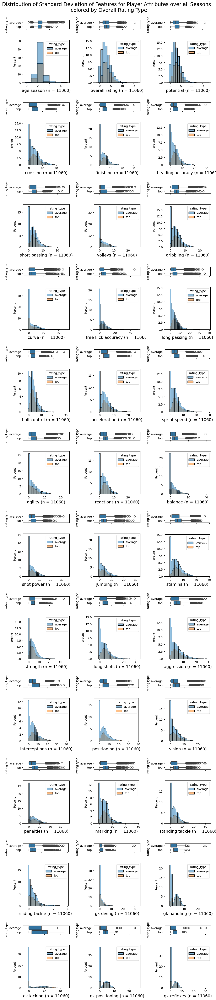

In [ ]:
title = 'Standard Deviation of Features for Player Attributes over all Seasons  \n colored by Overall Rating Type'

df = Player_Attributes_Player_std

n_cols=3

#features = list(df.columns[-4:])
features = df.select_dtypes(include=np.number).columns[3:].tolist()
# start from age; height/weight_std = 0.0 ---> seaborn/matplotlib crashes

binwidth = len(features) *[1]

multicol_histograms(df, features, n_cols = n_cols, hue = 'rating_type', binwidth = binwidth, title = title)

The Player Attributes cover a season range of 7-8 years. Not all player participated in every season  (Some join later, left earlier or were injured). With this an average standard deviation of player age of 2.4 is reasonable.
The standard deviations of most of the other features peaks around 2-4 with their overall distribution reaching out to 10-20. **It seem that the large majority of players don't change much in their skills.**
An exception is gk_kicking, which peaks at 20.

###### Unaveraged Player Attributes vs. Rating

In [ ]:
F_Player_Attributes.describe().round(1).T

,count,mean,std,min,25%,50%,75%,max
player_api_id,183978.0,135900.6,136927.8,2625.0,34763.0,77741.0,191080.0,750584.0
height,183978.0,181.9,6.4,157.5,177.8,182.9,185.4,208.3
weight,183978.0,168.8,15.1,117.0,159.0,168.0,179.0,243.0
age_season,183978.0,25.7,4.7,7.8,22.3,25.5,29.0,43.8
overall_rating,183142.0,68.6,7.0,33.0,64.0,69.0,73.0,94.0
potential,183142.0,73.5,6.6,39.0,69.0,74.0,78.0,97.0
crossing,183142.0,55.1,17.2,1.0,45.0,59.0,68.0,95.0
finishing,183142.0,49.9,19.0,1.0,34.0,53.0,65.0,97.0
heading_accuracy,183142.0,57.3,16.5,1.0,49.0,60.0,68.0,98.0
short_passing,183142.0,62.4,14.2,3.0,57.0,65.0,72.0,97.0


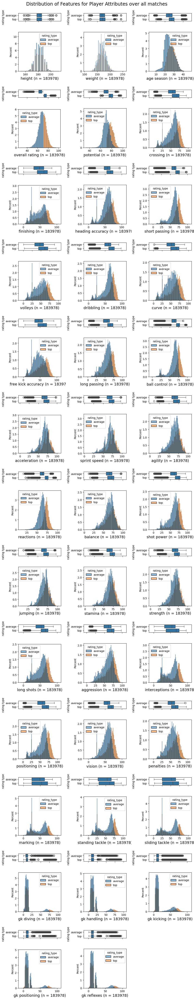

In [ ]:
title = 'Features for Player Attributes over all matches'

df = F_Player_Attributes

n_cols=3
binwidth = None

features = df.select_dtypes(include=np.number).columns[1:].tolist()

binwidth = len(features) *[1]

multicol_histograms(df, features, n_cols = n_cols, hue = 'rating_type', binwidth = binwidth, title = title)

Tha age peaks at 22 year for the average player and at 25/26 years for the top players. This suggest some increase of experience and/or skill levels with age.
**The shift of the distribution peaks of the top players towards higher values than of the average players is visible in all features**: e.g. potential: 70 (avg) vs 77 (top) or free kick accuracy: 50 (avg) vs. 70 (top).
Most properties peak at 50-60 for average players and at 70-75 for top players.

Moreover, all 'distinct match performance' (i.e. not overall rating etc.) features reveal a **double peaked structure** with the second peak around 10-30.

The gk_- features are listed for all players, but we can guess that only goal keepers will get high scores (>~50) here - it seems that their gk_feature distributions are distinct from those of the field player at <=25.

Let's color the distribution accordingly:

###### Attribute Means per Player vs Player-Type

In [ ]:
Player_Attributes_Player.describe().round(1).T

,count,mean,std,min,25%,50%,75%,max
player_api_id,11060.0,156582.4,160713.7,2625.0,35555.5,96619.5,212470.5,750584.0
height,11060.0,181.9,6.4,157.5,177.8,182.9,185.4,208.3
weight,11060.0,168.4,15.0,117.0,159.0,168.0,179.0,243.0
age_season,11060.0,25.4,4.5,13.1,21.9,25.1,28.6,41.1
overall_rating,11060.0,66.8,6.2,43.0,62.8,66.7,71.0,92.2
potential,11060.0,72.1,5.8,51.0,68.0,72.0,76.0,95.2
crossing,11060.0,52.9,16.2,6.0,43.4,56.3,64.7,89.4
finishing,11060.0,47.9,18.1,5.0,32.4,49.9,63.1,92.2
heading_accuracy,11060.0,56.1,15.7,8.0,49.1,58.8,66.8,93.1
short_passing,11060.0,60.4,13.5,10.6,55.6,63.0,69.0,95.2


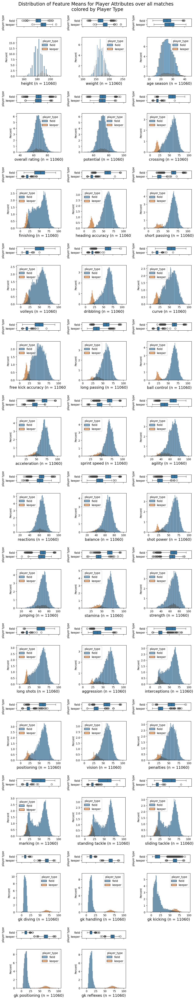

In [ ]:
title = 'Feature Means for Player Attributes over all matches \n colored by Player Type'

df = Player_Attributes_Player

n_cols=3
binwidth = None

features = df.select_dtypes(include=np.number).columns[1:].tolist()

binwidth = len(features) *[1]

multicol_histograms(df, features, n_cols = n_cols, hue = 'player_type', binwidth = binwidth, title = title)

Color coding the goal keepers gives an interesing insight:

**Keeper** seem to be **taller** (~8 cm) and **heavier** (10-15 pounds) than field players.
The first **show low values (often below or peak at 25) for all field related scores**, but high values on gk-scores (50-80), while the second show values below 25 in all the gk-featues except from gk_kicking - but the relation of the last property seems to be hard to interpret for field players.

#### Correlation

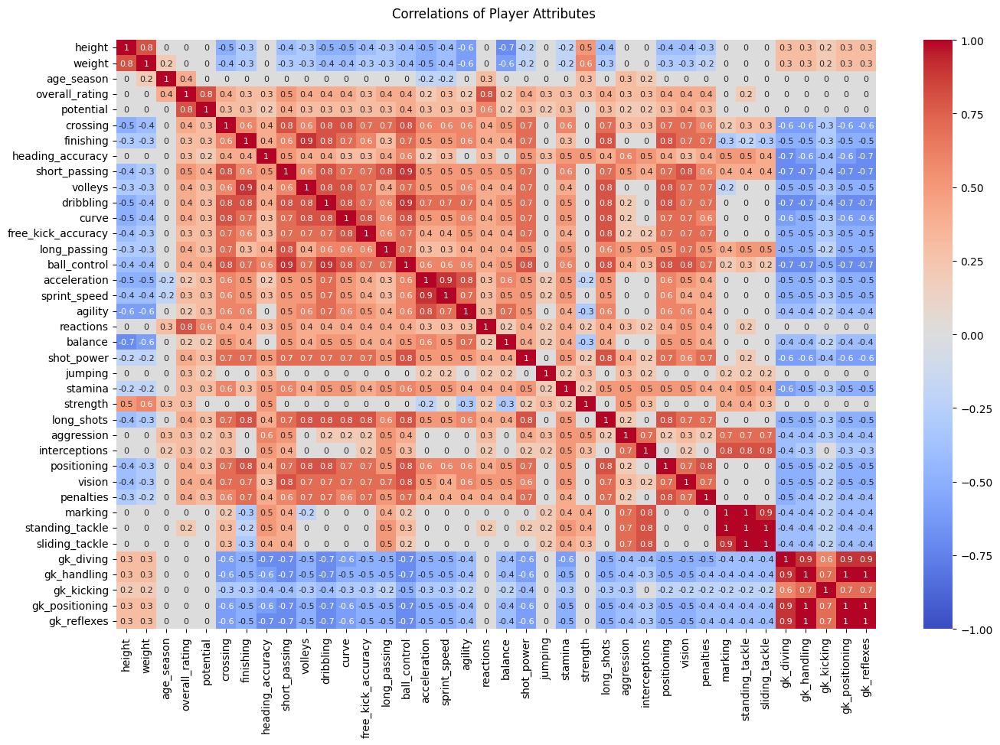

In [ ]:
features = df.select_dtypes(include=np.number).columns[1:].tolist()

Player_Attributes_corr = F_Player_Attributes[features].corr().round(1)


corrplot(Player_Attributes_corr, abs_cut_off = 0.2, fontsize = 8, title = 'of Player Attributes')

All ball control related features are strongly correlated among each other with values > 0.5, mostly around 0.8,
and strongly inversely correlated with goal keeping features, i.e. <-0.5.
Overall_rating shows a tight correlation with potential and reactions (0.8) and with vision 0.5.
Height and weight are inversely correlated with agility/speed related features.
The group of tacklings, marking, aggression, interceptions and the group of positioning, vision, penalties show strong correlations among themselves, i.e >0.7.
Age seems to be barely correlated <=0.4 with anything except from a mild correlations of 0.4 for overall rating, reaction, gk_kicking.

### Team Overview

In [ ]:
Team = '''
          SELECT *
          FROM Team
         '''
F_Team = pd.read_sql_query(Team, db)
F_Team.drop(['id', 'team_fifa_api_id'], axis=1, inplace=True)
F_Team[:10]

,team_api_id,team_long_name,team_short_name
0,9987,KRC Genk,GEN
1,9993,Beerschot AC,BAC
2,10000,SV Zulte-Waregem,ZUL
3,9994,Sporting Lokeren,LOK
4,9984,KSV Cercle Brugge,CEB
5,8635,RSC Anderlecht,AND
6,9991,KAA Gent,GEN
7,9998,RAEC Mons,MON
8,7947,FCV Dender EH,DEN
9,9985,Standard de Liège,STL


#### NaN/Duplicate Check

In [ ]:
nan_type_overview(F_Team)

,Nan?,#Nan,type
team_api_id,False,0,int64
team_long_name,False,0,object
team_short_name,False,0,object


In [ ]:
df = F_Team
df[df[['team_api_id', 'team_long_name', 'team_short_name']].duplicated() == True]  # find duplicate rows

,team_api_id,team_long_name,team_short_name


### Team Attributes Overview

In [ ]:
Team_Attributes = '''
          SELECT *
          FROM Team_Attributes
         '''
F_Team_Attributes = pd.read_sql_query(Team_Attributes, db)
F_Team_Attributes.drop(['id', 'team_fifa_api_id'], axis=1, inplace=True)
F_Team_Attributes[:10]

,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,chanceCreationPassing,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,9930,2010-02-22 00:00:00,60,Balanced,NaN,Little,50,Mixed,Organised,60,...,55,Normal,Organised,50,Medium,55,Press,45,Normal,Cover
1,9930,2014-09-19 00:00:00,52,Balanced,48.0,Normal,56,Mixed,Organised,54,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
2,9930,2015-09-10 00:00:00,47,Balanced,41.0,Normal,54,Mixed,Organised,54,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
3,8485,2010-02-22 00:00:00,70,Fast,NaN,Little,70,Long,Organised,70,...,70,Lots,Organised,60,Medium,70,Double,70,Wide,Cover
4,8485,2011-02-22 00:00:00,47,Balanced,NaN,Little,52,Mixed,Organised,53,...,52,Normal,Organised,47,Medium,47,Press,52,Normal,Cover
5,8485,2012-02-22 00:00:00,58,Balanced,NaN,Little,62,Mixed,Organised,45,...,55,Normal,Organised,40,Medium,40,Press,60,Normal,Cover
6,8485,2013-09-20 00:00:00,62,Balanced,NaN,Little,45,Mixed,Organised,40,...,55,Normal,Organised,42,Medium,42,Press,60,Normal,Cover
7,8485,2014-09-19 00:00:00,58,Balanced,64.0,Normal,62,Mixed,Organised,56,...,57,Normal,Organised,41,Medium,42,Press,60,Normal,Cover
8,8485,2015-09-10 00:00:00,59,Balanced,64.0,Normal,53,Mixed,Organised,51,...,63,Normal,Free Form,49,Medium,45,Press,63,Normal,Cover
9,8576,2010-02-22 00:00:00,60,Balanced,NaN,Little,40,Mixed,Organised,45,...,55,Normal,Organised,30,Deep,70,Double,30,Narrow,Offside Trap


Testing around with this table shows that from 2013 onwards the attrbutes are published in Mid-September, i.e. at the beginning of the season, rather that in February as in the seasons before 2013/2014. We can expect for future events that the team attributes appear early enough in a season so that they can be used to predict the winning quota of the current season.

#### NaN/Duplicate Check

In [ ]:
nan_type_overview(F_Team_Attributes)

,Nan?,#Nan,type
team_api_id,False,0,int64
date,False,0,object
buildUpPlaySpeed,False,0,int64
buildUpPlaySpeedClass,False,0,object
buildUpPlayDribbling,True,969,float64
buildUpPlayDribblingClass,False,0,object
buildUpPlayPassing,False,0,int64
buildUpPlayPassingClass,False,0,object
buildUpPlayPositioningClass,False,0,object
chanceCreationPassing,False,0,int64


In [ ]:
df = F_Team_Attributes
df[df[['team_api_id', 'date']].duplicated() == True]  # find duplicate rows

,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,chanceCreationPassing,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
860,9996,2015-09-10 00:00:00,50,Balanced,50.0,Normal,50,Mixed,Organised,50,...,50,Normal,Organised,45,Medium,45,Press,50,Normal,Cover


In [ ]:
df.loc[(df.team_api_id == 9996) & (df.date == '2015-09-10 00:00:00')]

,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,chanceCreationPassing,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
859,9996,2015-09-10 00:00:00,50,Balanced,50.0,Normal,50,Mixed,Organised,50,...,50,Normal,Organised,45,Medium,45,Press,50,Normal,Cover
860,9996,2015-09-10 00:00:00,50,Balanced,50.0,Normal,50,Mixed,Organised,50,...,50,Normal,Organised,45,Medium,45,Press,50,Normal,Cover


Duplicate of exactly the same row - will be averaged out, when we group by season and team later.

#### Pie Charts for Categorical Features

In [ ]:
df = F_Team_Attributes
cat_features = df.select_dtypes('object').columns[1:].tolist()

titles = cat_features

for feature, title in zip(cat_features, titles):
    quick_pie(df, feature, rank_lvl=0, show_other=False, title=title)

Most -Class-features are based on their numerical twin and for most of them the largest category holds more then 80% of the teams. Hence, I consider them not very informative.

#### Histograms

In [ ]:
F_Team_Attributes.describe().round(1)

,team_api_id,buildUpPlaySpeed,buildUpPlayDribbling,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth
count,1458.0,1458.0,489.0,1458.0,1458.0,1458.0,1458.0,1458.0,1458.0,1458.0
mean,9995.7,52.5,48.6,48.5,52.2,53.7,54.0,46.0,49.3,52.2
std,13264.9,11.5,9.7,10.9,10.4,11.1,10.3,10.2,9.7,9.6
min,1601.0,20.0,24.0,20.0,21.0,20.0,22.0,23.0,24.0,29.0
25%,8457.8,45.0,42.0,40.0,46.0,47.0,48.0,39.0,44.0,47.0
50%,8674.0,52.0,49.0,50.0,52.0,53.0,53.0,45.0,48.0,52.0
75%,9904.0,62.0,55.0,55.0,59.0,62.0,61.0,51.0,55.0,58.0
max,274581.0,80.0,77.0,80.0,80.0,80.0,80.0,72.0,72.0,73.0


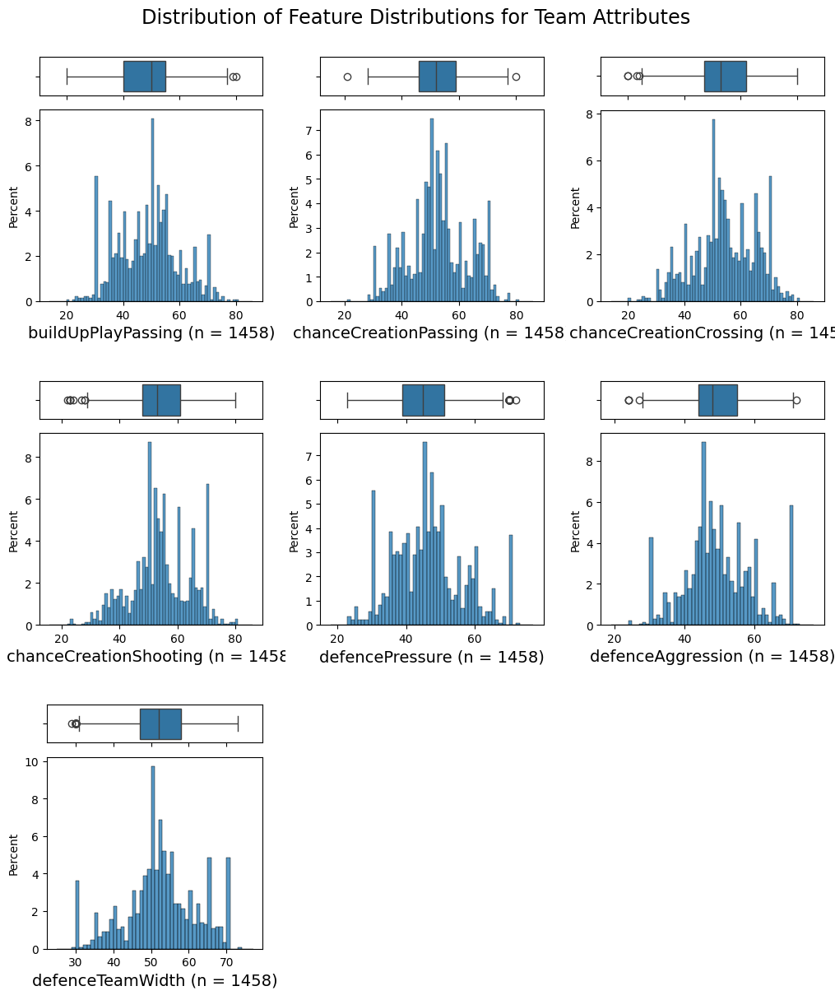

In [ ]:
title = 'Feature Distributions for Team Attributes'

df = F_Team_Attributes
features = df.select_dtypes(include=np.number).columns[3:].tolist()

n_cols=3
#binwidth = None
binwidth = len(features) *[1]

multicol_histograms(df, features, n_cols = n_cols, binwidth = binwidth, title = title)

In [ ]:
Team_Attributes_std = F_Team_Attributes.groupby(['team_api_id']).std(numeric_only=True)
Team_Attributes_std.reset_index(inplace=True)
Team_Attributes_std[:5].round(2)

,team_api_id,buildUpPlaySpeed,buildUpPlayDribbling,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth
0,1601,8.91,0.00,8.38,10.88,12.44,8.09,8.82,6.41,0.52
1,1773,0.00,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,1957,15.29,0.00,13.94,3.49,5.85,2.10,14.28,7.31,8.09
3,2033,8.94,NaN,7.77,1.64,10.47,9.42,7.12,10.62,9.04
4,2182,10.69,3.54,9.12,7.37,11.08,1.55,6.19,7.37,9.38


In [ ]:
Team_Attributes_std.describe().round(1).T

,count,mean,std,min,25%,50%,75%,max
team_api_id,288.0,11317.4,22228.1,1601.0,8370.8,8658.5,9885.8,274581.0
buildUpPlaySpeed,274.0,8.9,4.4,0.0,6.1,8.8,11.6,33.9
buildUpPlayDribbling,227.0,3.4,4.6,0.0,0.0,1.4,5.7,20.5
buildUpPlayPassing,274.0,8.2,4.1,0.0,5.8,8.1,10.8,24.7
chanceCreationPassing,274.0,7.9,4.2,0.0,4.8,7.9,10.9,19.2
chanceCreationCrossing,274.0,8.1,4.5,0.0,5.1,7.7,11.2,22.8
chanceCreationShooting,274.0,8.1,4.4,0.0,5.3,7.7,11.1,19.8
defencePressure,274.0,7.7,3.9,0.0,4.8,7.5,10.5,18.0
defenceAggression,274.0,8.0,3.7,0.0,5.8,8.4,10.2,19.1
defenceTeamWidth,274.0,7.3,3.8,0.0,4.5,7.8,10.0,17.7


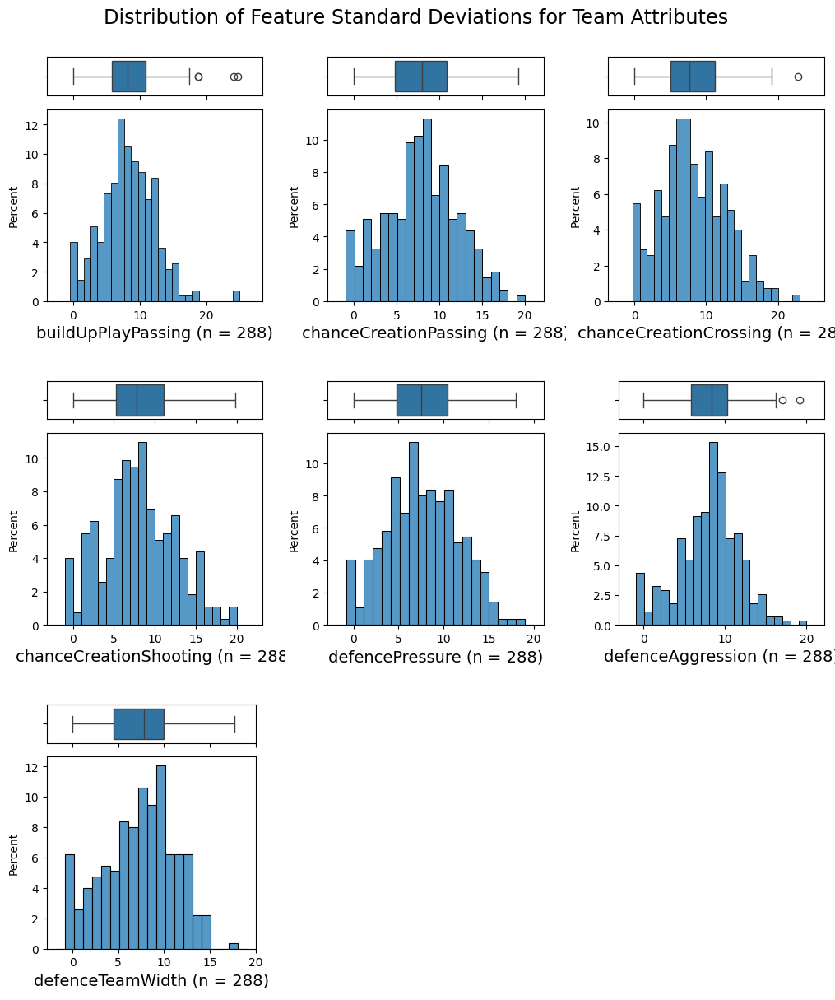

In [ ]:
title = 'Feature Standard Deviations for Team Attributes'

df = Team_Attributes_std
features = df.select_dtypes(include=np.number).columns[3:].tolist()

n_cols=3

#binwidth = None
binwidth = len(features) *[1]

multicol_histograms(df, features, n_cols = n_cols, binwidth = binwidth, title = title)

The changes in the Team Attributes over all seasons are stronger (peak at ~8) than in the Player Attributes (peak ~3).

#### Correlation

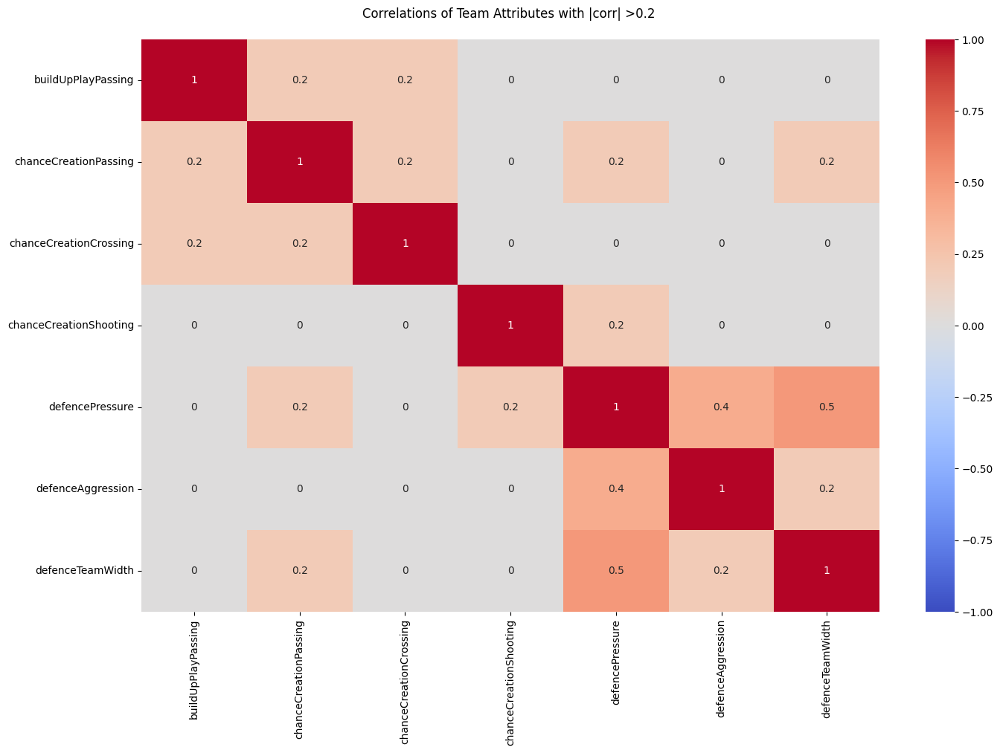

In [ ]:
df = F_Team_Attributes
features = df.select_dtypes(include=np.number).columns[3:].tolist()
corr = F_Team_Attributes[features].corr().round(1)
abs_cut_off = 0.2

corrplot(corr, abs_cut_off = abs_cut_off, fontsize = 10, title = 'of Team Attributes with |corr| >' + str(abs_cut_off))

Most features are only weakly correlated with each other.
Highest correlations show values of 0.4-0.5 and are:
* buildUpPlayPassing - buildUpPlaySpeed
* defenceAggression, defenceTeamWidth - defencePressure

### Match Overview

In [ ]:
Match = '''
          SELECT *
          FROM Match
         '''
F_Match = pd.read_sql_query(Match, db)
F_Match.head()


,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,...,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA
0,1,1,1,2008/2009,1,2008-08-17 00:00:00,492473,9987,9993,1,...,4.00,1.65,3.40,4.50,1.78,3.25,4.00,1.73,3.40,4.20
1,2,1,1,2008/2009,1,2008-08-16 00:00:00,492474,10000,9994,0,...,3.80,2.00,3.25,3.25,1.85,3.25,3.75,1.91,3.25,3.60
2,3,1,1,2008/2009,1,2008-08-16 00:00:00,492475,9984,8635,0,...,2.50,2.35,3.25,2.65,2.50,3.20,2.50,2.30,3.20,2.75
3,4,1,1,2008/2009,1,2008-08-17 00:00:00,492476,9991,9998,5,...,7.50,1.45,3.75,6.50,1.50,3.75,5.50,1.44,3.75,6.50
4,5,1,1,2008/2009,1,2008-08-16 00:00:00,492477,7947,9985,1,...,1.73,4.50,3.40,1.65,4.50,3.50,1.65,4.75,3.30,1.67


In [ ]:
print(F_Match.columns[10:-10])

Index(['away_team_goal', 'home_player_X1', 'home_player_X2', 'home_player_X3',
       'home_player_X4', 'home_player_X5', 'home_player_X6', 'home_player_X7',
       'home_player_X8', 'home_player_X9', 'home_player_X10',
       'home_player_X11', 'away_player_X1', 'away_player_X2', 'away_player_X3',
       'away_player_X4', 'away_player_X5', 'away_player_X6', 'away_player_X7',
       'away_player_X8', 'away_player_X9', 'away_player_X10',
       'away_player_X11', 'home_player_Y1', 'home_player_Y2', 'home_player_Y3',
       'home_player_Y4', 'home_player_Y5', 'home_player_Y6', 'home_player_Y7',
       'home_player_Y8', 'home_player_Y9', 'home_player_Y10',
       'home_player_Y11', 'away_player_Y1', 'away_player_Y2', 'away_player_Y3',
       'away_player_Y4', 'away_player_Y5', 'away_player_Y6', 'away_player_Y7',
       'away_player_Y8', 'away_player_Y9', 'away_player_Y10',
       'away_player_Y11', 'home_player_1', 'home_player_2', 'home_player_3',
       'home_player_4', 'home_player_5',

What does 'stage' mean?

In [ ]:
F_Match.loc[(F_Match.league_id==7809) & (F_Match.season == '2013/2014')].stage.value_counts()

,count
stage,
1,9
32,9
27,9
28,9
29,9
3,9
30,9
31,9
33,9


Stage means the round of matches in a season, i.e. the German Bundesliga comprises 18 teams --> iterating through all combinations of teams, two against each team, once at home and once away ---> 34 rounds

#### NaN/Duplicate Check

In [ ]:
#too long here - covered in 'SQL Tables Overview'
#nan_type_overview(F_Match)

In [ ]:
df = F_Match
df[df[['date', 'match_api_id', 'home_team_api_id', 'away_team_api_id']].duplicated() == True]  # find duplicate rows

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,...,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA


#### XML- and Odds- Presence Check

In [ ]:
match_overview = '''
          SELECT country, season, date, match_api_id, home_team_api_id, home_team,
                 away_team_api_id, away_team, home_team_goal, away_team_goal,
                 goal, shoton, shotoff,
                 B365H, B365D, B365A
          FROM Match m
          JOIN  (SELECT id, name AS country
                 FROM Country) c
          ON    m.league_id=c.id

          JOIN  (SELECT team_api_id, team_long_name AS home_team
                 FROM Team) h
          ON    m.home_team_api_id=h.team_api_id

          JOIN  (SELECT team_api_id, team_long_name AS away_team
                 FROM Team) a
          ON    m.away_team_api_id=a.team_api_id
         '''
F_match_overview_xml_odds_check = pd.read_sql_query(match_overview, db)
F_match_overview_xml_odds_check.goal[6]
#          WHERE goal NOT NULL

In [ ]:
df = F_match_overview_xml_odds_check

F_no_goal = missing_values(df, 'goal', no_count_col = 'no_goal_count')
F_no_xml = missing_values(df, 'shoton', no_count_col = 'no_xml_count')
F_no_odds = missing_values(df, 'B365H', no_count_col = 'no_odds_count')

In [ ]:
F_no_goal

,country,match_count,no_goal_count,2008/2009,2009/2010,2010/2011,2011/2012,2012/2013,2013/2014,2014/2015,2015/2016
0,Belgium,1728.0,1728.0,306.0,210.0,240.0,240.0,240.0,12.0,240.0,240.0
1,England,3040.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,France,3040.0,1014.0,380.0,380.0,147.0,107.0,0.0,0.0,0.0,0.0
3,Germany,2448.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Italy,3017.0,3.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
5,Netherlands,2448.0,1918.0,304.0,302.0,302.0,299.0,306.0,306.0,99.0,0.0
6,Poland,1920.0,1913.0,240.0,240.0,240.0,233.0,240.0,240.0,240.0,240.0
7,Portugal,2052.0,2052.0,240.0,240.0,240.0,240.0,240.0,240.0,306.0,306.0
8,Scotland,1824.0,1811.0,225.0,224.0,224.0,226.0,228.0,228.0,228.0,228.0
9,Spain,3040.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
F_no_xml

,country,match_count,no_xml_count,2008/2009,2009/2010,2010/2011,2011/2012,2012/2013,2013/2014,2014/2015,2015/2016
0,Belgium,1728.0,1728.0,306.0,210.0,240.0,240.0,240.0,12.0,240.0,240.0
1,England,3040.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,France,3040.0,1014.0,380.0,380.0,147.0,107.0,0.0,0.0,0.0,0.0
3,Germany,2448.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Italy,3017.0,3.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
5,Netherlands,2448.0,1918.0,304.0,302.0,302.0,299.0,306.0,306.0,99.0,0.0
6,Poland,1920.0,1913.0,240.0,240.0,240.0,233.0,240.0,240.0,240.0,240.0
7,Portugal,2052.0,2052.0,240.0,240.0,240.0,240.0,240.0,240.0,306.0,306.0
8,Scotland,1824.0,1811.0,225.0,224.0,224.0,226.0,228.0,228.0,228.0,228.0
9,Spain,3040.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


Complete (< 0.1%) XML data for all seasons is available for England, Germany, Italy, and Spain. For France, the XML data is complete from season 2012/2013 on.

In [ ]:
F_no_odds

,country,match_count,no_odds_count,2008/2009,2009/2010,2010/2011,2011/2012,2012/2013,2013/2014,2014/2015,2015/2016
0,Belgium,1728.0,22.0,3.0,0.0,0.0,2.0,5.0,12.0,0.0,0.0
1,England,3040.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,France,3040.0,4.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
3,Germany,2448.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,Italy,3017.0,6.0,0.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0
5,Netherlands,2448.0,3.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
6,Poland,1920.0,1920.0,240.0,240.0,240.0,240.0,240.0,240.0,240.0,240.0
7,Portugal,2052.0,8.0,2.0,1.0,1.0,2.0,0.0,1.0,1.0,0.0
8,Scotland,1824.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Spain,3040.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Betting Odds from the most present bookmaker in the data (B365) is fully (< 0.5% missing) available for all countries except from Poland and Switzerland. For Belgium, about 1.3% of matches lack odds information which is negligible.

### Match Table Engineering: XML

#### Decipher Goals-XML-Code

In [ ]:
### each normal or penalty goal with its minute of score

scores_df = duckdb.query(
            '''
            INSTALL sqlite;
            LOAD sqlite;

            SELECT c.country, match_api_id, season, t.team, p.player, goal_type, time_elapsed, time_plus
            FROM (SELECT league_id, match_api_id, season, goal_type, team_id, player_id,
                         time_elapsed, time_plus
                  FROM (SELECT league_id, match_api_id, season,
                               regexp_extract(items, '<comment>([a-zA-Z]+)<\/comment>', 1) AS goal_type,
                               regexp_extract(items, '<team>([0-9]+)<\/team>', 1) AS team_id,
                               regexp_extract(items, '<player1>([0-9]+)<\/player1>', 1) AS player_id,
                               regexp_extract(items, '<elapsed>([0-9]+)<\/elapsed>', 1) AS time_elapsed,
                               regexp_extract(items, '<elapsed_plus>([0-9]+)<\/elapsed_plus>', 1) AS time_plus
                        FROM (SELECT league_id, match_api_id, season,
                                     UNNEST (regexp_split_to_array(goal, '<\/value><value>')) AS items
                              FROM sqlite_scan('database.sqlite', 'Match')
                              )
                        )
                  WHERE NOT player_id = '' AND goal_type IN ('n','p')
                  ) g


            JOIN  (SELECT team_api_id, team_long_name AS team
                   FROM sqlite_scan('database.sqlite', 'Team')) t
            ON    g.team_id = t.team_api_id

            JOIN  (SELECT id, name AS country
                   FROM sqlite_scan('database.sqlite', 'Country')) c
            ON    g.league_id = c.id

            JOIN  (SELECT player_api_id, player_name AS player
                   FROM sqlite_scan('database.sqlite', 'Player')) p
            ON    g.player_id = p.player_api_id

            ORDER BY 1, 3, 4, 2, 6


            '''
            ).to_df()


# saved here for eventual need:
#            GROUP BY 1,2,3,4, 5
#            ORDER BY 1, 4, 3


In [ ]:
scores_df[10000:10005]

,country,match_api_id,season,team,player,goal_type,time_elapsed,time_plus
10000,Germany,674495,2009/2010,Bayer 04 Leverkusen,Patrick Helmes,n,73,
10001,Germany,674495,2009/2010,Bayer 04 Leverkusen,Stefan Kiessling,n,66,
10002,Germany,674498,2009/2010,Bayer 04 Leverkusen,Gonzalo Castro,n,84,
10003,Germany,674498,2009/2010,Bayer 04 Leverkusen,Stefan Kiessling,n,62,
10004,Germany,674498,2009/2010,Bayer 04 Leverkusen,Eren Derdiyok,n,55,


Only the goal types of n (normal), p (penalty) and o (own goals) are goals. Other goal types aren´t goals at all, but missed or saved penalties (npm & psm), disallowed goals (dg), etc.

The home/away team goals information is available for all matches - the XML based goal-counts might underestimate the actual goal-counts especially for the smaller countries/leagues (missing values for 45% of the matches).

#### QUESTION: Who are the top scorers in each team and league?


In [ ]:
scores_per_team = scores_df.groupby(['country', 'team', 'player', 'season'])['match_api_id'].count().to_frame()
scores_per_team.reset_index(inplace=True)
scores_per_team.rename(columns={'match_api_id': 'scores'}, inplace=True)

In [ ]:
scores_per_team[:5]

,country,team,player,season,scores
0,England,Arsenal,Aaron Ramsey,2009/2010,3
1,England,Arsenal,Aaron Ramsey,2010/2011,1
2,England,Arsenal,Aaron Ramsey,2011/2012,2
3,England,Arsenal,Aaron Ramsey,2012/2013,1
4,England,Arsenal,Aaron Ramsey,2013/2014,9


In [ ]:
scores_per_team.to_csv(home_folder + 'products/Scores_per_team_season.csv')

In [ ]:
idx = scores_per_team.groupby(['country', 'team'])['scores'].transform(max) == scores_per_team['scores']
top_scorer_per_team = scores_per_team[idx]
#top_scorer_per_team.reset_index(inplace=True, drop=True)
top_scorer_per_team = top_scorer_per_team.sort_values(by=['country', 'scores'], ascending = [True,False])
top_scorer_per_team['player_team'] = top_scorer_per_team['player'] +' - '+ top_scorer_per_team['team']

top_scorer_per_team[:5]

,country,team,player,season,scores,player_team
684,England,Liverpool,Luis Suarez,2013/2014,31,Luis Suarez - Liverpool
72,England,Arsenal,Robin van Persie,2011/2012,30,Robin van Persie - Arsenal
357,England,Chelsea,Didier Drogba,2009/2010,29,Didier Drogba - Chelsea
907,England,Manchester United,Wayne Rooney,2011/2012,27,Wayne Rooney - Manchester United
1195,England,Sunderland,Darren Bent,2009/2010,24,Darren Bent - Sunderland


In [ ]:
top_scorer_per_team.to_csv(home_folder + 'products/Top_scorer_per_team.csv')

An interactive overview of the top scorers per team and country can be found in my dashboard:
https://lookerstudio.google.com/s/rfCBA74X9nI

#### Fun Fact: Distribution of Extra-Time Goals

In [ ]:
scores_df['time_elapsed'] = scores_df['time_elapsed'].astype('float')
scores_df.loc[scores_df.time_plus == '', 'time_plus'] = np.nan
scores_df['time_plus'] = scores_df['time_plus'].astype('float')

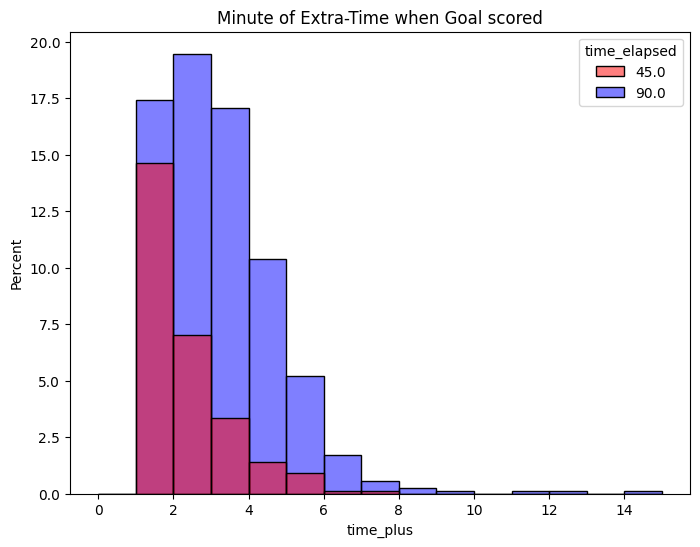

In [ ]:
df = scores_df.loc[~(scores_df.time_plus.isna())]
title = 'Minute of Extra-Time when Goal scored'

fig = plt.figure(figsize=(8,6)) # define plot area
ax = fig.gca() # define axis

sns.histplot(data = df, x= 'time_plus', hue = 'time_elapsed', binwidth = 1,
             palette=['red', 'blue'], binrange = [0,15], stat = 'percent', ax=ax)
plt.title(title);



In the first extra-time after a regular 45 min match half-time, the majority of goals is shot in the first minute of extra time.

In the second extra-time after the regular 90th minute, the majority of goals is shot around the second minute of extra time. In addition, the extra-times tend to be twice as long as the half-time extra-time. The latest moment after a  90 min main match, at which a goal has been scored, is in the 14 minute.

#### QUESTION: Which leagues score the most/fewest goals?


In [ ]:
match_overview = '''
          SELECT country, season, date, match_api_id,
                 home_team_api_id, home_team,
                 away_team_api_id, away_team,
                 home_team_goal, away_team_goal,
                 home_team_goal - away_team_goal AS home_goal_diff,
                 away_team_goal - home_team_goal AS away_goal_diff,
                 shoton, shotoff, foulcommit, card, cross, corner, possession,
                 B365H, B365D, B365A
          FROM Match m
          JOIN  (SELECT id, name AS country
                 FROM Country) c
          ON    m.league_id=c.id

          JOIN  (SELECT team_api_id, team_long_name AS home_team
                 FROM Team) h
          ON    m.home_team_api_id=h.team_api_id

          JOIN  (SELECT team_api_id, team_long_name AS away_team
                 FROM Team) a
          ON    m.away_team_api_id=a.team_api_id
         '''
F_match_overview = pd.read_sql_query(match_overview, db)

In [ ]:
league_goals = F_match_overview[['country', 'home_team_goal', 'away_team_goal']].groupby('country').sum()
league_goals.reset_index(inplace=True)
league_goals['total_goals'] = league_goals['home_team_goal'] + league_goals['away_team_goal']
league_goals.sort_values(by='total_goals', ascending = False, inplace=True)
league_goals

,country,home_team_goal,away_team_goal,total_goals
9,Spain,4959,3453,8412
1,England,4715,3525,8240
4,Italy,4528,3367,7895
5,Netherlands,4357,3185,7542
2,France,4265,3162,7427
3,Germany,3982,3121,7103
7,Portugal,2890,2311,5201
0,Belgium,2781,2060,4841
8,Scotland,2607,2197,4804
6,Poland,2678,1978,4656


#### Decipher XML-code in shoton, shotoff, etc.

What is in an XML code?

In [ ]:
F_match_overview.loc[~(F_match_overview.shoton.isnull())]["shoton"][:1]

1728    <shoton><value><stats><blocked>1</blocked></stats><event_incident_typefk>61</event_incident_typefk><elapsed>3</elapsed><subtype>blocked_shot</subtype><player1>24154</player1><sortorder>0</sortorder><team>10260</team><n>253</n><type>shoton</type><id>378828</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>154</event_incident_typefk><elapsed>7</elapsed><subtype>header</subtype><player1>24157</player1><sortorder>2</sortorder><team>10260</team><n>258</n><type>shoton</type><id>378866</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>153</event_incident_typefk><elapsed>14</elapsed><subtype>shot</subtype><player1>30829</player1><sortorder>1</sortorder><team>10260</team><n>274</n><type>shoton</type><id>378922</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>153</event_incident_typefk><elapsed>14</elapsed><subtype>shot</subtype><player1>30373</player1><sortorder>2</sortorder><team>10260</team><n>279</n><type>shoton</type><id>378923</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>137</event_incident_typefk><elapsed>17</elapsed><subtype>distance</subtype><player1>30373</player1><sortorder>3</sortorder><team>10260</team><n>272</n><type>shoton</type><id>378951</id></value><value><stats><blocked>1</blocked></stats><event_incident_typefk>61</event_incident_typefk><elapsed>43</elapsed><subtype>blocked_shot</subtype><player1>24154</player1><sortorder>0</sortorder><team>10260</team><n>296</n><type>shoton</type><id>379204</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>137</event_incident_typefk><elapsed>50</elapsed><subtype>distance</subtype><player1>37799</player1><sortorder>0</sortorder><team>10261</team><n>302</n><type>shoton</type><id>379363</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>149</event_incident_typefk><elapsed>58</elapsed><subtype>distance</subtype><player1>24157</player1><sortorder>0</sortorder><team>10260</team><n>310</n><type>shoton</type><id>379401</id></value><value><stats><blocked>1</blocked></stats><event_incident_typefk>61</event_incident_typefk><elapsed>58</elapsed><subtype>blocked_shot</subtype><player1>24157</player1><sortorder>4</sortorder><team>10260</team><n>311</n><type>shoton</type><id>379406</id></value><value><stats><blocked>1</blocked></stats><event_incident_typefk>61</event_incident_typefk><elapsed>60</elapsed><subtype>blocked_shot</subtype><player1>30829</player1><sortorder>0</sortorder><team>10260</team><n>314</n><type>shoton</type><id>379414</id></value><value><stats><shoton>1</shoton></stats><event_incident_typefk>136</event_incident_typefk><elapsed>64</elapsed><subtype>header</subtype><player1>24157</player1><sortorder>0</sortorder><team>10260</team><n>319</n><type>shoton</type><id>379426</id></value><value><stats><blocked>1</blocked></stats><event_incident_typefk>61</event_incident_typefk><elapsed>75</elapsed><subtype>blocked_shot</subtype><player1>30829</player1><sortorder>5</sortorder><team>10260</team><n>338</n><type>shoton</type><id>379466</id></value></shoton>
Name: shoton, dtype: object

In [ ]:
F_match_overview.loc[~(F_match_overview.possession.isnull())]["possession"][:1]

,possession
1728,<possession><value><comment>56</comment><event_incident_typefk>352</event_incident_typefk><elapsed>25</elapsed><subtype>possession</subtype><sortorder>1</sortorder><awaypos>44</awaypos><homepos>56</homepos><n>68</n><type>special</type><id>379029</id></value><value><comment>54</comment><elapsed_plus>1</elapsed_plus><event_incident_typefk>352</event_incident_typefk><elapsed>45</elapsed><subtype>possession</subtype><sortorder>4</sortorder><awaypos>46</awaypos><homepos>54</homepos><n>117</n><type>special</type><id>379251</id></value><value><comment>54</comment><event_incident_typefk>352</event_incident_typefk><elapsed>70</elapsed><subtype>possession</subtype><sortorder>0</sortorder><awaypos>46</awaypos><homepos>54</homepos><n>190</n><type>special</type><id>379443</id></value><value><comment>55</comment><elapsed_plus>5</elapsed_plus><event_incident_typefk>352</event_incident_typefk><elapsed>90</elapsed><subtype>possession</subtype><sortorder>1</sortorder><awaypos>45</awaypos><homepos>55</homepos><n>252</n><type>special</type><id>379575</id></value></possession>


Translate the gibberish:

In [ ]:
df_match = F_match_overview

xml_cols = ['shoton', 'shotoff', 'foulcommit',
 'card', 'cross', 'corner', 'possession']

for col in xml_cols:
    df_match[col+"_home"] = np.nan
    df_match[col+"_away"] = np.nan

    if col == 'possession':
        df_match[col+"_home"] = df_match.apply(lambda x : extract_possession_xml(x,col,"homepos"), axis = 1)
        df_match[col+"_away"] = df_match.apply(lambda x : extract_possession_xml(x,col,"awaypos"), axis = 1)
    else:
        df_match[col+"_home"] = df_match.apply(lambda x : extract_xml(x,col,"team","home"), axis = 1)
        df_match[col+"_away"] = df_match.apply(lambda x : extract_xml(x,col,"team","away"), axis = 1)
    df_match.drop([col], axis=1, inplace=True)


The new columns:

In [ ]:
F_match_overview.columns

Index(['country', 'season', 'date', 'match_api_id', 'home_team_api_id',
       'home_team', 'away_team_api_id', 'away_team', 'home_team_goal',
       'away_team_goal', 'home_goal_diff', 'away_goal_diff', 'B365H', 'B365D',
       'B365A', 'shoton_home', 'shoton_away', 'shotoff_home', 'shotoff_away',
       'foulcommit_home', 'foulcommit_away', 'card_home', 'card_away',
       'cross_home', 'cross_away', 'corner_home', 'corner_away',
       'possession_home', 'possession_away'],
      dtype='object')

#### QUESTION: Is there such a thing as home advantage?


##### INDEPENDENT SAMPLE T-TEST: There is no home advantage for mean goals per match

* Null-Hypothesis H_0: mean(home_team_goal) = mean(away_team_goal)

* alternative Hypothesis H_a: mean(home_team_goal) != mean(away_team_goal)

* significance level: alpha = 0.05


In [ ]:
sample_1 = F_match_overview['home_team_goal']
sample_2 = F_match_overview['away_team_goal']

Let's check the normality of the data:

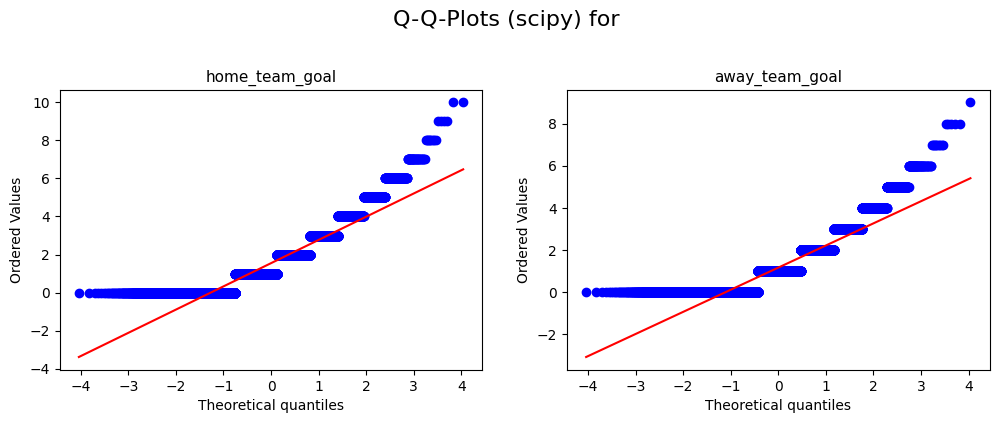

In [ ]:
q_q_plot([sample_1, sample_2], ['home_team_goal', 'away_team_goal'])

Well, the data deviates strongly towards the absolute theoretical quantiles > 2. Nevertheless, the sample sizes are large enough to fulfill the assumptions for the t-test.

In [ ]:
res = pg.ttest(sample_1, sample_2, paired=False)

print('t-statistics : ',  res['T'].values[0].round(2))
print('p-values :     ',  res['p-val'].values[0].round(3))
print('95% - CI :      [', res['CI95%'][0][0], ',' , res['CI95%'][0][1], ']' )


t-statistics :  35.78
p-values :      0.0
95% - CI :      [ 0.36 , 0.4 ]



With a t-statistic > 35 and a
p-value < 10^-3 for a significance level alpha = 0.05, I can reject the null hypothesis (=no difference in means).

Based on the estimated difference in sample means, I can support that there is a significant difference between the pop means of home team goals and away team goals in the matches table.

With 95% confidence, I expect the home team goals mean to be 0.36 - 0.4 goals higher than the away team goals mean.

#### Histograms and Correlations

In [ ]:
F_match_overview.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
match_api_id,25979.0,1195429.16,494627.86,483129.00,768436.50,1147511.0,1709852.50,2216672.00
home_team_api_id,25979.0,9984.37,14087.45,1601.00,8475.00,8697.0,9925.00,274581.00
away_team_api_id,25979.0,9984.48,14087.45,1601.00,8475.00,8697.0,9925.00,274581.00
home_team_goal,25979.0,1.54,1.30,0.00,1.00,1.0,2.00,10.00
away_team_goal,25979.0,1.16,1.14,0.00,0.00,1.0,2.00,9.00
home_goal_diff,25979.0,0.38,1.78,-9.00,-1.00,0.0,1.00,10.00
away_goal_diff,25979.0,-0.38,1.78,-10.00,-1.00,0.0,1.00,9.00
B365H,22592.0,2.63,1.79,1.04,1.67,2.1,2.80,26.00
B365D,22592.0,3.84,1.12,1.40,3.30,3.5,4.00,17.00
B365A,22592.0,4.66,3.73,1.08,2.50,3.5,5.25,51.00


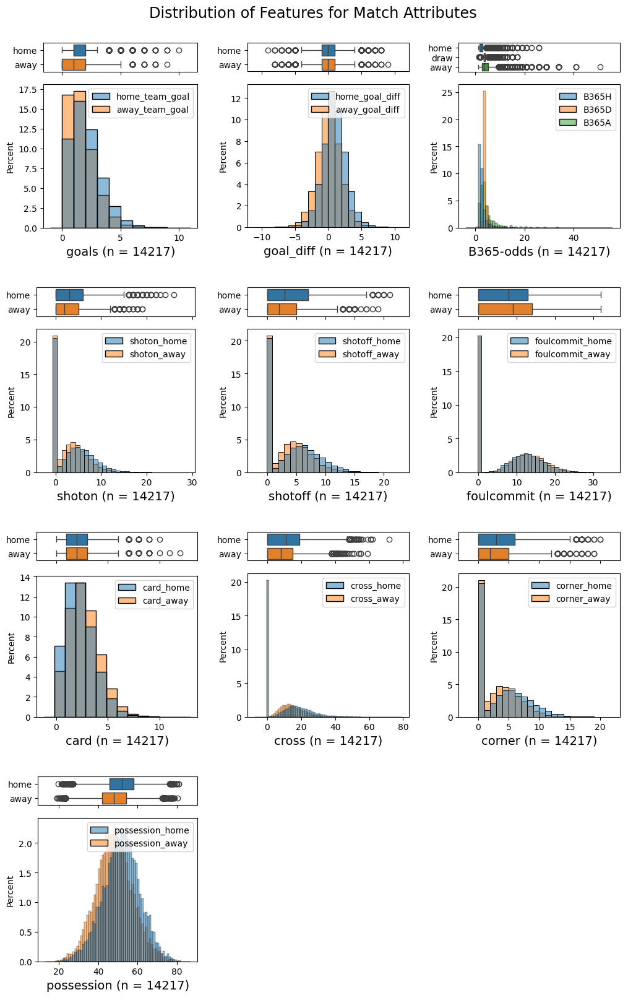

In [ ]:
df = F_match_overview.loc[~(F_match_overview.shoton_home.isna())]

title = 'Features for Match Attributes'

n_cols=3

features = [['home_team_goal', 'away_team_goal'],
 ['home_goal_diff', 'away_goal_diff'],
 ['B365H', 'B365D', 'B365A'],
 ['shoton_home', 'shoton_away'],
 ['shotoff_home', 'shotoff_away'],
 ['foulcommit_home', 'foulcommit_away'],
 ['card_home', 'card_away'],
 ['cross_home','cross_away'],
 ['corner_home','corner_away'],
 ['possession_home','possession_away'],
]

names = ['goals',
 'goal_diff',
 'B365-odds',
 'shoton',
 'shotoff',
 'foulcommit',
 'card',
 'cross',
 'corner',
 'possession',
]

binwidth = len(features) * [1]
yticklabels = len(names) * [['home', 'away']]
yticklabels[2] = ['home', 'draw', 'away']

multicol_histograms(df, features, n_cols = n_cols, binwidth = binwidth, title = title, xlabels = names, yticklabels = yticklabels)

Are the peaks at zero Nan-artefacts or valid (do the other XML entries have non-zero entries?


They do:

In [ ]:
F_match_overview.loc[(F_match_overview.shoton_home == 0) & (F_match_overview.shotoff_home == 0)][:5]

,country,season,date,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,away_team_goal,...,foulcommit_home,foulcommit_away,card_home,card_away,cross_home,cross_away,corner_home,corner_away,possession_home,possession_away
5553,France,2010/2011,2010-12-01 00:00:00,829987,8592,Olympique de Marseille,9851,Stade Rennais FC,0,0,...,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
5577,France,2010/2011,2010-12-01 00:00:00,830070,9873,Valenciennes FC,9853,AS Saint-Étienne,1,1,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
5590,France,2010/2011,2010-11-30 00:00:00,830083,8521,Stade Brestois 29,8588,RC Lens,4,1,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
5598,France,2010/2011,2010-12-04 00:00:00,830091,108893,AC Arles-Avignon,8481,AS Nancy-Lorraine,1,1,...,0.0,0.0,2.0,4.0,0.0,0.0,0.0,0.0,NaN,NaN
5599,France,2010/2011,2010-12-04 00:00:00,830092,8588,RC Lens,8583,AJ Auxerre,1,1,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN


#### Correlations

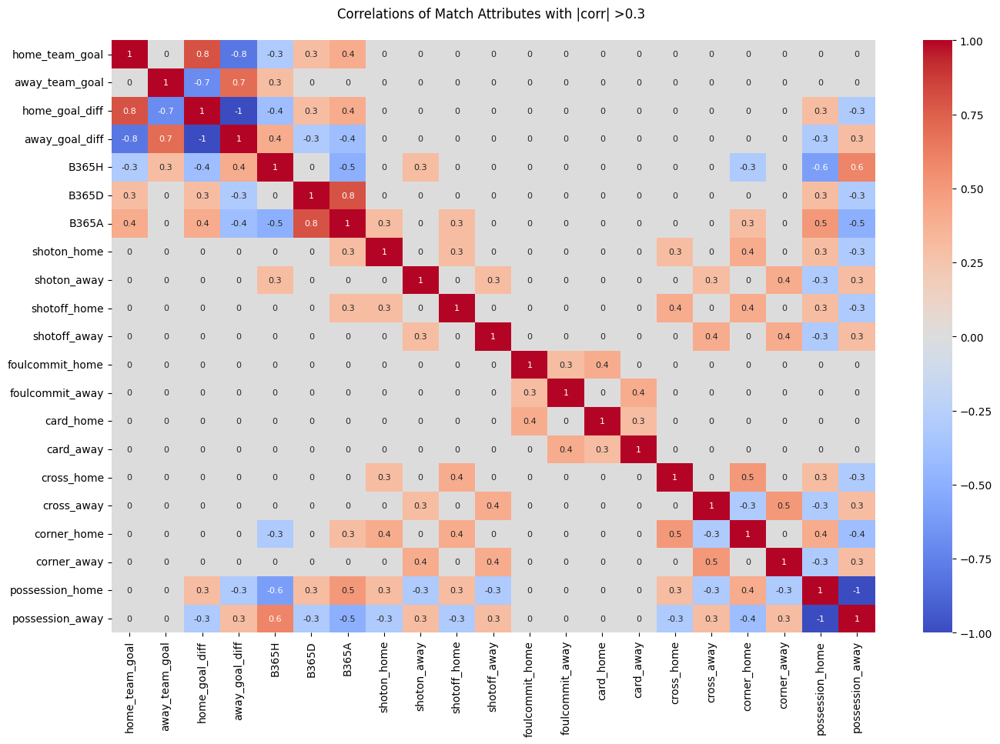

In [ ]:
features = list(F_match_overview.columns)
F_match_overview_corr = F_match_overview[features[8:]].dropna().corr().round(1)

abs_cut_off = 0.3
corrplot(F_match_overview_corr, abs_cut_off = abs_cut_off, fontsize = 8,
         title = 'of Match Attributes with |corr| >' + str(abs_cut_off))

Strong absolute correlation (0.8) between goal and goal difference - the latter is derived from the former.
Weak/medium correlation of home_team_goal with odds (H: -0.3 ,D: 0.3, A: 0.3).
B365A and B365D are strongly correlated (0.8).

Possession (home) correlates strongest with B365H (home: -0.6) and B365A (home: 0.5). 'away' behaves inversely.

Corner and Cross are correlated for home and away, respectively (0.5).

### Wins, Draws, Losses, Goals, XML-features per Seasons

In [ ]:
F_match_overview_winner = F_match_overview

Assign categories to the match result for home and away

In [ ]:
df = F_match_overview_winner

df['home_winner'] = 'Draw'
df['away_winner'] = 'Draw'

for index in df.index :
    if df.loc[index,'home_team_goal'] > df.loc[index,'away_team_goal']:
        df.loc[index,'home_winner'] = 'Win'
        df.loc[index,'away_winner'] = 'Loss'
    elif df.loc[index,'home_team_goal'] < df.loc[index,'away_team_goal']:
        df.loc[index,'home_winner'] = 'Loss'
        df.loc[index,'away_winner'] = 'Win'


In [ ]:
F_match_overview_winner.loc[F_match_overview_winner.possession_home > 0.0][:5]

,country,season,date,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,away_team_goal,...,card_home,card_away,cross_home,cross_away,corner_home,corner_away,possession_home,possession_away,home_winner,away_winner
1728,England,2008/2009,2008-08-17 00:00:00,489042,10260,Manchester United,10261,Newcastle United,1,1,...,3.0,0.0,24.0,9.0,6.0,6.0,54.75,45.25,Draw,Draw
1729,England,2008/2009,2008-08-16 00:00:00,489043,9825,Arsenal,8659,West Bromwich Albion,1,0,...,0.0,0.0,21.0,7.0,7.0,5.0,64.25,35.75,Win,Loss
1730,England,2008/2009,2008-08-16 00:00:00,489044,8472,Sunderland,8650,Liverpool,0,1,...,0.0,2.0,15.0,19.0,1.0,8.0,45.50,54.50,Loss,Win
1731,England,2008/2009,2008-08-16 00:00:00,489045,8654,West Ham United,8528,Wigan Athletic,2,1,...,2.0,1.0,15.0,27.0,6.0,10.0,49.75,50.25,Win,Loss
1732,England,2008/2009,2008-08-17 00:00:00,489046,10252,Aston Villa,8456,Manchester City,4,2,...,0.0,1.0,16.0,16.0,7.0,8.0,51.50,48.50,Win,Loss


Create a new table with all home teams for each season from the match table:

In [ ]:
F_team_season_id = F_match_overview_winner.groupby(['country','home_team_api_id', 'home_team', 'season']
                                  ).mean(numeric_only=True).reset_index()[
                                    ['country', 'home_team_api_id', 'home_team', 'season']]

F_team_season_id.columns = ['country', 'team_api_id', 'team_long_name', 'season']
F_collect_wins_goals = F_team_season_id
F_collect_wins_goals[-10:]

,country,team_api_id,team_long_name,season
1471,Switzerland,10199,FC Luzern,2014/2015
1472,Switzerland,10199,FC Luzern,2015/2016
1473,Switzerland,10243,FC Zürich,2008/2009
1474,Switzerland,10243,FC Zürich,2009/2010
1475,Switzerland,10243,FC Zürich,2010/2011
1476,Switzerland,10243,FC Zürich,2011/2012
1477,Switzerland,10243,FC Zürich,2012/2013
1478,Switzerland,10243,FC Zürich,2013/2014
1479,Switzerland,10243,FC Zürich,2014/2015
1480,Switzerland,10243,FC Zürich,2015/2016


Gather the home and away performance of a team for each feature type:

In [ ]:
df = F_collect_wins_goals
df_source = F_match_overview_winner

F_collect_wins_goals = collect_wins_goals(df, df_source)

In [ ]:
F_collect_wins_goals.to_csv(home_folder + 'products/F_collect_wins_goals.csv')

Choose a subset to inspect results (first country in the list is Belgium which lack the XML information):

In [ ]:
#F_collect_wins_goals.loc[F_collect_wins_goals.country=='England'].sort_values(by = ['team_long_name', 'season'])[:20].round(2).T

An interactive overview of the winning fraction and goals per match per team and country can be found in my dashboard: https://lookerstudio.google.com/s/rfCBA74X9nI

#### Plots

##### Scatter Matrix on 'Total_'-Features

In [ ]:
df=F_collect_wins_goals

features = ['total_win', 'total_draw', 'total_loss', 'total_goals', 'total_shoton',
       'total_shotoff', 'total_foulcommit', 'total_card', 'total_cross',
       'total_corner', 'total_possession', 'home_advantage'
       ]

fig = px.scatter_matrix(df, dimensions=features, color='total_win',
    title="Scatter Matrix of aggregated Match Data",
    labels={col:col.replace('total_', '').replace('_', ' ') for col in df[features]} ) # remove underscore

fig.update_traces(diagonal_visible=False)
fig.update_layout(height = 1400, width = 1000)

fig.show()

##### Scatter Matrices for home and away features

In [ ]:
df = F_collect_wins_goals

xvalues_list = [
                ['home_goals', 'away_goals'],
                ['home_shoton', 'away_shoton'],
                ['home_shotoff', 'away_shotoff'],
                ['home_foulcommit', 'away_foulcommit'],
                ['home_card', 'away_card'],
                ['home_cross', 'away_cross'],
                ['home_corner', 'away_corner'],
                ['home_possession', 'away_possession'],
                ['home_advantage', 'away_disadvantage']
                ]

yvalues_list = len(xvalues_list) * [['home_win', 'away_win']]
names_list = (len(xvalues_list)-1) * [['home', 'away']] + [['home_advantage', 'away_disadvantage']]

xtitle_list = [
               "goals",
               'shoton',
               'shotoff',
               'foulcommit',
               'card',
               'cross',
               'corner',
               'possession',
               'dis/advantage'
               ]
ytitle_list = len(xvalues_list) * ['wins']
title_list = ['Winning Fraction vs. ' +x.capitalize() for x in xtitle_list]

all_lists = zip(xvalues_list, yvalues_list, names_list, xtitle_list, ytitle_list, title_list)

for xvalues, yvalues, names, xtitle, ytitle, title in all_lists:
    quick_scatter(df, xvalues, yvalues, names = names,
              xtitle = xtitle, ytitle = ytitle, title = title)


##### Correlations

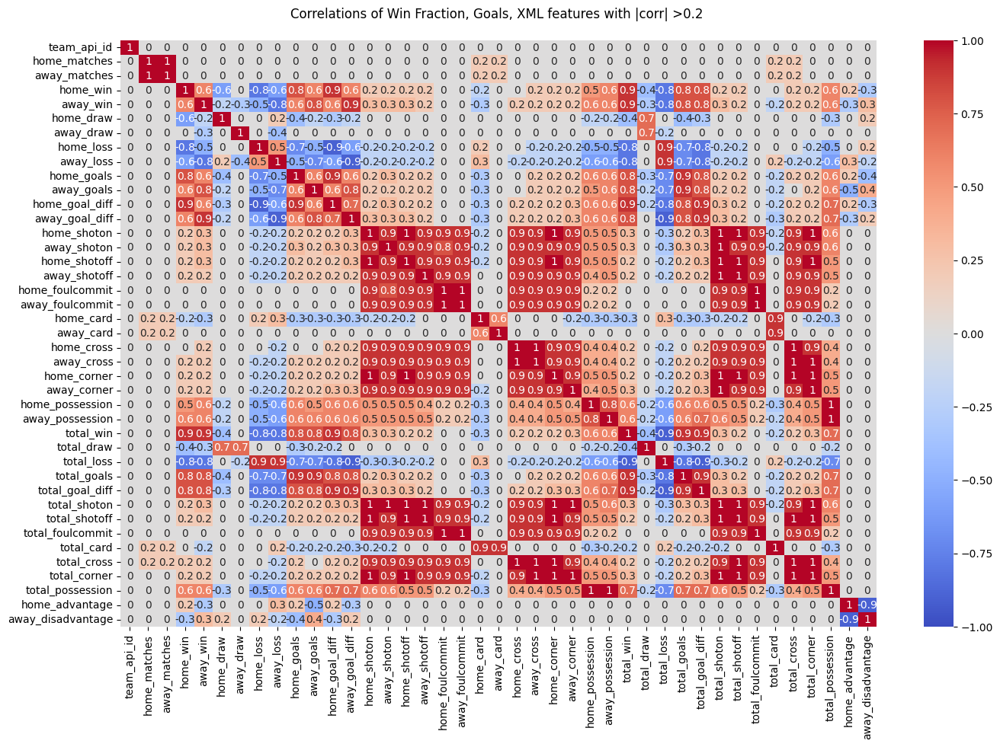

In [ ]:
df = F_collect_wins_goals
features = df.select_dtypes(include=np.number).columns[0:].tolist()
corr = df[features].corr().round(1)
abs_cut_off = 0.2

corrplot(corr, abs_cut_off = abs_cut_off, fontsize = 10,
         title = 'of Win Fraction, Goals, XML features with |corr| >' + str(abs_cut_off))

### Preparation for Modelling

#### Wins and Goals Quotas into Match Table (per Country)

Imagine a match is running and you should guess who wins? What would you look at? The performance in a previous match, overall performance over previous seasons.

I will transfer the information from the Win-Draw-Loss-Goals-XML table to the Match table. For each match entry, I will average totals for each performance feature per home and per away team
over a user-defined number *'number_of_last_seasons'* (typically the last one or two) of nearest previous season.

In order to capture the potential psychological 'curse' of a specific team pairing ('X has never ever won against Y'), I average the goals per team in each pairing (regardless of 'home' or 'away' location) in the match table over a second user-defined number *'limit_all_seasons'* (typically need all seasons to get a meaningful mean)




In [ ]:
df_match = F_match_overview.copy()
df_wins = F_collect_wins_goals

number_of_last_seasons = 2   # for win, etc average
limit_all_seasons = 5        # for goals average in current pairing


# switch country_list according to preference:
country_list = df_match.country.unique()
#country_list = ['England']

F_match_last_results = add_seasons_feature_means_to_match(df_match, df_wins,
                                     country_list = country_list,
                                     number_of_last_seasons=2,
                                     limit_all_seasons = 5)
F_match_last_results[-5:].round(2)

Deriving table for Belgium
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for England
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for France
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for Germany
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for Italy
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for Netherlands
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for Poland
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015 ... 2015/2016 .
Deriving table for Portugal
... 2009/2010 ... 2010/2011 ... 2011/2012 ... 2012/2013 ... 2013/2014 ... 2014/2015

,country,season,date,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,away_team_goal,...,home_team_cross_season,away_team_cross_season,home_team_corner_season,away_team_corner_season,home_team_possession_season,away_team_possession_season,home_team_goals_paring,away_team_goals_paring,home_home_advantage_goals_season,away_home_advantage_goals_season
25974,Switzerland,2015/2016,2015-09-22 00:00:00,1992091,10190,FC St. Gallen,10191,FC Thun,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,0.75,1.44,1.28,2.62
25975,Switzerland,2015/2016,2015-09-23 00:00:00,1992092,9824,FC Vaduz,10199,FC Luzern,1,2,...,NaN,NaN,NaN,NaN,NaN,NaN,0.25,1.25,1.00,0.86
25976,Switzerland,2015/2016,2015-09-23 00:00:00,1992093,9956,Grasshopper Club Zürich,10179,FC Sion,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.25,1.50,1.00,2.36
25977,Switzerland,2015/2016,2015-09-22 00:00:00,1992094,7896,Lugano,10243,FC Zürich,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.77
25978,Switzerland,2015/2016,2015-09-23 00:00:00,1992095,10192,BSC Young Boys,9931,FC Basel,4,3,...,NaN,NaN,NaN,NaN,NaN,NaN,1.30,1.80,1.91,1.05


In [ ]:
#F_match_last_results[-10:].round(2).T

In [ ]:
F_match_last_results.to_csv(home_folder + 'products/F_match_last_results.csv')

In [ ]:
F_match_last_results = pd.read_csv(home_folder + 'products/F_match_last_results.csv')

Overview of the old and new columns in the Match table:

In [ ]:
F_match_last_results.columns

Index(['Unnamed: 0', 'country', 'season', 'date', 'match_api_id',
       'home_team_api_id', 'home_team', 'away_team_api_id', 'away_team',
       'home_team_goal', 'away_team_goal', 'home_goal_diff', 'away_goal_diff',
       'B365H', 'B365D', 'B365A', 'shoton_home', 'shoton_away', 'shotoff_home',
       'shotoff_away', 'foulcommit_home', 'foulcommit_away', 'card_home',
       'card_away', 'cross_home', 'cross_away', 'corner_home', 'corner_away',
       'possession_home', 'possession_away', 'home_winner', 'away_winner',
       'home_team_win_season', 'away_team_win_season', 'home_team_draw_season',
       'away_team_draw_season', 'home_team_loss_season',
       'away_team_loss_season', 'home_team_goals_season',
       'away_team_goals_season', 'home_team_goal_diff_season',
       'away_team_goal_diff_season', 'home_team_shoton_season',
       'away_team_shoton_season', 'home_team_shotoff_season',
       'away_team_shotoff_season', 'home_team_foulcommit_season',
       'away_team_foulcom

Little inspection by picking an example to check how the goals from the previous years are averaged in the pairing columns.

In [ ]:
df=F_match_last_results
df.loc[((df.home_team == 'Manchester United') &
      (df.away_team == 'Tottenham Hotspur')) |
      ((df.home_team == 'Tottenham Hotspur') &
      (df.away_team == 'Manchester United'))].sort_values(by='home_team')[['match_api_id','season', 'date',
       'home_team_api_id',
       'home_team', 'away_team_api_id', 'away_team', 'home_team_goal',
       'away_team_goal', 'home_team_goals_paring',
       'away_team_goals_paring', 'home_team_goals_season',
       'away_team_goals_season', 'home_team_win_season',
       'away_team_win_season']].round(2)

,match_api_id,season,date,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,away_team_goal,home_team_goals_paring,away_team_goals_paring,home_team_goals_season,away_team_goals_season,home_team_win_season,away_team_win_season
1998,489373,2008/2009,2009-04-25 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,5,2,NaN,NaN,NaN,NaN,NaN,NaN
2402,659173,2009/2010,2010-04-24 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,3,1,2.50,1.00,1.79,1.18,0.74,0.37
2498,839904,2010/2011,2010-10-30 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,2,0,2.75,1.00,2.26,1.76,0.71,0.55
2983,1024308,2011/2012,2011-08-22 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,3,0,2.17,0.67,2.05,1.45,0.61,0.42
3592,1228445,2012/2013,2012-09-29 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,2,3,2.38,0.62,2.34,1.74,0.74,0.53
3752,1474698,2013/2014,2014-01-01 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,1,2,2.20,0.90,2.26,1.74,0.74,0.55
4224,1724268,2014/2015,2015-03-15 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,3,0,2.00,1.10,1.68,1.45,0.50,0.55
4393,1987037,2015/2016,2015-08-08 00:00:00,10260,Manchester United,8586,Tottenham Hotspur,1,0,1.70,0.90,1.63,1.53,0.53,0.50
1810,489204,2008/2009,2008-12-13 00:00:00,8586,Tottenham Hotspur,10260,Manchester United,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2440,658615,2009/2010,2009-09-12 00:00:00,8586,Tottenham Hotspur,10260,Manchester United,1,3,1.00,2.50,1.18,1.79,0.37,0.74


#### Preparation for merging tables via seasons

Players can have multiple entries in a season, team seems to have only one entry per season. Player and Team Attribute tables have only dates. We need to inspect the overlapping time ranges for the match, team_attribute, and player_attribute tables and to define the time ranges per season.

In [ ]:
print('Match table time ranges: ', F_Match.date.min(),  ' - ',  F_Match.date.max())
print('Player table time ranges: ', F_Player_Attributes.date.min(), ' - ',  F_Player_Attributes.date.max())
print('Team table time ranges:   ', F_Team_Attributes.date.min(), ' - ',  F_Team_Attributes.date.max())

Match table time ranges:  2008-07-18 00:00:00  -  2016-05-25 00:00:00
Player table time ranges:  2007-02-22 00:00:00  -  2016-07-07 00:00:00
Team table time ranges:    2010-02-22 00:00:00  -  2015-09-10 00:00:00


Team Attribute are not available before season 2009/2010.

Seasons are defined by the Matches table:

In [ ]:
Match_Seasons = '''
          SELECT MIN(date) AS "Min_Date", MAX(date) AS "Max_Date", season, count(season) AS number_matches
          FROM Match
          GROUP BY season
         '''
F_Match_Seasons = pd.read_sql_query(Match_Seasons, db)

F_Match_Seasons["Min_Date"] = pd.to_datetime(F_Match_Seasons["Min_Date"], format="%Y-%m-%d %H:%M:%S")
F_Match_Seasons["Max_Date"] = pd.to_datetime(F_Match_Seasons["Max_Date"], format="%Y-%m-%d %H:%M:%S")

F_Match_Seasons

,Min_Date,Max_Date,season,number_matches
0,2008-07-18,2009-05-31,2008/2009,3326
1,2009-07-11,2010-05-16,2009/2010,3230
2,2010-07-17,2011-05-29,2010/2011,3260
3,2011-07-16,2012-05-23,2011/2012,3220
4,2012-07-13,2013-06-02,2012/2013,3260
5,2013-07-13,2014-05-18,2013/2014,3032
6,2014-07-18,2015-05-31,2014/2015,3325
7,2015-07-17,2016-05-25,2015/2016,3326


Translate the match seasons table above into SQL statements


In [ ]:
season_class = []
df = F_Match_Seasons
for i in range(0,len(df)):
    min_date = df.Min_Date.loc[i].date()
    max_date = df.Max_Date.loc[i].date()
    season = df.season.loc[i]

    when_string = 'WHEN date BETWEEN "' +str(min_date)+ '" AND "' +str(max_date)+ '" THEN "' +str(season) + '"'
    season_class.append(when_string)

season_class_str = ' \n '.join(season_class)

What it looks like:

In [ ]:
season_class_str

'WHEN date BETWEEN "2008-07-18" AND "2009-05-31" THEN "2008/2009" \n WHEN date BETWEEN "2009-07-11" AND "2010-05-16" THEN "2009/2010" \n WHEN date BETWEEN "2010-07-17" AND "2011-05-29" THEN "2010/2011" \n WHEN date BETWEEN "2011-07-16" AND "2012-05-23" THEN "2011/2012" \n WHEN date BETWEEN "2012-07-13" AND "2013-06-02" THEN "2012/2013" \n WHEN date BETWEEN "2013-07-13" AND "2014-05-18" THEN "2013/2014" \n WHEN date BETWEEN "2014-07-18" AND "2015-05-31" THEN "2014/2015" \n WHEN date BETWEEN "2015-07-17" AND "2016-05-25" THEN "2015/2016"'

#### Get Team Attributes into Match Table

In [ ]:
# load Team_Attributes aggregated by the season case statments

Team_Attributes = '''
          SELECT *,
            CASE {}
              ELSE 1
            END AS season
          FROM Team_Attributes
          GROUP BY team_api_id, season
         '''
F_Team_Attributes_season = pd.read_sql_query(Team_Attributes.format(season_class_str), db)

F_Team_Attributes_season[:10]

,id,team_fifa_api_id,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,...,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass,season
0,1113,874,1601,2010-02-22 00:00:00,30,Slow,NaN,Little,40,Mixed,...,Lots,Organised,65,Medium,60,Press,50,Normal,Cover,2009/2010
1,1114,874,1601,2011-02-22 00:00:00,48,Balanced,NaN,Little,51,Mixed,...,Normal,Organised,46,Medium,48,Press,50,Normal,Cover,2010/2011
2,1115,874,1601,2012-02-22 00:00:00,53,Balanced,NaN,Little,55,Mixed,...,Normal,Organised,43,Medium,44,Press,49,Normal,Cover,2011/2012
3,1116,874,1601,2013-09-20 00:00:00,53,Balanced,NaN,Little,55,Mixed,...,Normal,Organised,43,Medium,44,Press,49,Normal,Cover,2013/2014
4,1117,874,1601,2014-09-19 00:00:00,53,Balanced,48.0,Normal,38,Mixed,...,Normal,Organised,43,Medium,44,Press,49,Normal,Cover,2014/2015
5,1118,874,1601,2015-09-10 00:00:00,47,Balanced,48.0,Normal,38,Mixed,...,Normal,Organised,43,Medium,44,Press,49,Normal,Cover,2015/2016
6,941,100087,1773,2012-02-22 00:00:00,52,Balanced,NaN,Little,50,Mixed,...,Normal,Organised,43,Medium,44,Press,50,Normal,Cover,2011/2012
7,942,100087,1773,2013-09-20 00:00:00,52,Balanced,NaN,Little,50,Mixed,...,Normal,Organised,43,Medium,44,Press,50,Normal,Cover,2013/2014
8,943,100087,1773,2014-09-19 00:00:00,52,Balanced,51.0,Normal,50,Mixed,...,Normal,Organised,43,Medium,44,Press,50,Normal,Cover,2014/2015
9,619,110745,1957,2010-02-22 00:00:00,30,Slow,NaN,Little,50,Mixed,...,Lots,Organised,70,High,70,Double,70,Wide,Cover,2009/2010


Merge attributes for home and away team into the match table

In [ ]:
F_match_last_results_team = F_match_last_results.merge(F_Team_Attributes_season,
                                                         left_on = ['home_team_api_id', 'season'],
                                                         right_on=['team_api_id', 'season'],
                                                         suffixes = ['_m', ''],
                                                         how='outer')

F_match_last_results_team = F_match_last_results_team.merge(F_Team_Attributes_season,
                                                         left_on = ['away_team_api_id', 'season'],
                                                         right_on=['team_api_id', 'season'],
                                                         suffixes = ['_h', '_a'],
                                                         how='outer')

F_match_last_results_team.drop(['id_h', 'team_fifa_api_id_h', 'team_api_id_h', 'date_h',
                                'id_a', 'team_fifa_api_id_a', 'team_api_id_a', 'date_a'
                                ], axis=1, inplace=True)

F_match_last_results_team[:5]

,Unnamed: 0,country,season,date_m,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,...,chanceCreationShooting_a,chanceCreationShootingClass_a,chanceCreationPositioningClass_a,defencePressure_a,defencePressureClass_a,defenceAggression_a,defenceAggressionClass_a,defenceTeamWidth_a,defenceTeamWidthClass_a,defenceDefenderLineClass_a
0,0.0,Belgium,2008/2009,2008-08-17 00:00:00,492473.0,9987.0,KRC Genk,9993.0,Beerschot AC,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,29.0,Belgium,2008/2009,2008-11-15 00:00:00,492584.0,10000.0,SV Zulte-Waregem,9993.0,Beerschot AC,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,263.0,Belgium,2008/2009,2008-09-20 00:00:00,492519.0,9984.0,KSV Cercle Brugge,9993.0,Beerschot AC,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,143.0,Belgium,2008/2009,2009-02-21 00:00:00,493015.0,9991.0,KAA Gent,9993.0,Beerschot AC,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,98.0,Belgium,2008/2009,2009-01-24 00:00:00,492819.0,7947.0,FCV Dender EH,9993.0,Beerschot AC,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Overview over all the new features

In [ ]:
F_match_last_results_team.columns[:50]

Index(['Unnamed: 0', 'country', 'season', 'date_m', 'match_api_id',
       'home_team_api_id', 'home_team', 'away_team_api_id', 'away_team',
       'home_team_goal', 'away_team_goal', 'home_goal_diff', 'away_goal_diff',
       'B365H', 'B365D', 'B365A', 'shoton_home', 'shoton_away', 'shotoff_home',
       'shotoff_away', 'foulcommit_home', 'foulcommit_away', 'card_home',
       'card_away', 'cross_home', 'cross_away', 'corner_home', 'corner_away',
       'possession_home', 'possession_away', 'home_winner', 'away_winner',
       'home_team_win_season', 'away_team_win_season', 'home_team_draw_season',
       'away_team_draw_season', 'home_team_loss_season',
       'away_team_loss_season', 'home_team_goals_season',
       'away_team_goals_season', 'home_team_goal_diff_season',
       'away_team_goal_diff_season', 'home_team_shoton_season',
       'away_team_shoton_season', 'home_team_shotoff_season',
       'away_team_shotoff_season', 'home_team_foulcommit_season',
       'away_team_foulc

In [ ]:
F_match_last_results_team.columns[50:100]

Index(['home_team_cross_season', 'away_team_cross_season',
       'home_team_corner_season', 'away_team_corner_season',
       'home_team_possession_season', 'away_team_possession_season',
       'home_team_goals_paring', 'away_team_goals_paring',
       'home_home_advantage_goals_season', 'away_home_advantage_goals_season',
       'buildUpPlaySpeed_h', 'buildUpPlaySpeedClass_h',
       'buildUpPlayDribbling_h', 'buildUpPlayDribblingClass_h',
       'buildUpPlayPassing_h', 'buildUpPlayPassingClass_h',
       'buildUpPlayPositioningClass_h', 'chanceCreationPassing_h',
       'chanceCreationPassingClass_h', 'chanceCreationCrossing_h',
       'chanceCreationCrossingClass_h', 'chanceCreationShooting_h',
       'chanceCreationShootingClass_h', 'chanceCreationPositioningClass_h',
       'defencePressure_h', 'defencePressureClass_h', 'defenceAggression_h',
       'defenceAggressionClass_h', 'defenceTeamWidth_h',
       'defenceTeamWidthClass_h', 'defenceDefenderLineClass_h',
       'buildUpPl

In [ ]:
F_match_last_results_team.columns[100:150]

Index(['defenceTeamWidthClass_a', 'defenceDefenderLineClass_a'], dtype='object')

#### Get Player Attributes into Match Table

Create a helper-match-table to collect all player in a match:

In [ ]:
match_overview = '''
          SELECT country, season, date, match_api_id,
                 home_team_api_id, home_team,
                 away_team_api_id, away_team,
                 home_team_goal, away_team_goal,
                 home_player_1, home_player_2, home_player_3,
                 home_player_4, home_player_5, home_player_6, home_player_7,
                 home_player_8, home_player_9, home_player_10, home_player_11,
                 away_player_1, away_player_2, away_player_3, away_player_4,
                 away_player_5, away_player_6, away_player_7, away_player_8,
                 away_player_9, away_player_10, away_player_11
          FROM Match m
          JOIN  (SELECT id, name AS country
                 FROM Country) c
          ON    m.league_id=c.id

          JOIN  (SELECT team_api_id, team_long_name AS home_team
                 FROM Team) h
          ON    m.home_team_api_id=h.team_api_id

          JOIN  (SELECT team_api_id, team_long_name AS away_team
                 FROM Team) a
          ON    m.away_team_api_id=a.team_api_id
         '''
F_match_overview_player = pd.read_sql_query(match_overview, db)
F_match_overview_player[5000:5005]

,country,season,date,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,away_team_goal,...,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11
5000,France,2008/2009,2009-04-04 00:00:00,483444,9855,Grenoble Foot 38,8689,FC Lorient,1,3,...,40718.0,46540.0,40740.0,33122.0,41232.0,40731.0,40730.0,26392.0,39968.0,35409.0
5001,France,2008/2009,2009-04-04 00:00:00,483445,8682,Le Mans FC,9748,Olympique Lyonnais,1,3,...,26162.0,30931.0,37553.0,34320.0,26155.0,26294.0,30684.0,25572.0,26166.0,40659.0
5002,France,2008/2009,2009-04-04 00:00:00,483446,9829,AS Monaco,9746,Le Havre AC,0,1,...,46645.0,71607.0,39977.0,24423.0,46647.0,46650.0,33108.0,46660.0,26405.0,26282.0
5003,France,2008/2009,2009-04-04 00:00:00,483447,9830,FC Nantes,8639,LOSC Lille,0,2,...,51409.0,26107.0,26149.0,77741.0,40544.0,26291.0,20401.0,32575.0,107417.0,27445.0
5004,France,2008/2009,2009-04-05 00:00:00,483448,9847,Paris Saint-Germain,9831,OGC Nice,2,1,...,41121.0,41120.0,26304.0,41019.0,94318.0,30908.0,103487.0,26289.0,39987.0,38108.0


In [ ]:
# load Player_Attributes aggregated over all seasons

Player_Attributes = '''
          SELECT *,
            CASE {}
              ELSE 1
            END AS season
          FROM Player_Attributes pa
          JOIN  (SELECT player_api_id AS player_id, birthday
                 FROM Player) p
          ON    pa.player_api_id = p.player_id
          WHERE date BETWEEN "2008-07-18" AND "2016-05-25"
          GROUP BY player_api_id, season
         '''
F_Player_Attributes_season = pd.read_sql_query(Player_Attributes.format(season_class_str), db)

F_Player_Attributes_season.drop(['id',
                       'player_fifa_api_id',
                       'player_id'
                       ], axis=1, inplace=True)

F_Player_Attributes_season[:5]

,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,...,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,birthday,season
0,2625,2013-06-07 00:00:00,61,61,right,medium,medium,50,47,46,...,62,63,54.0,12,11,6,8,8,1981-01-27 00:00:00,1
1,2625,2008-08-30 00:00:00,60,64,right,high,medium,48,48,47,...,64,66,63.0,14,24,67,24,24,1981-01-27 00:00:00,2008/2009
2,2625,2011-02-22 00:00:00,59,63,right,high,medium,52,47,46,...,63,63,62.0,12,11,6,8,8,1981-01-27 00:00:00,2010/2011
3,2625,2012-02-22 00:00:00,58,58,right,medium,medium,52,47,46,...,63,63,52.0,12,11,6,8,8,1981-01-27 00:00:00,2011/2012
4,2625,2013-03-08 00:00:00,61,61,right,medium,medium,50,47,46,...,62,63,54.0,12,11,6,8,8,1981-01-27 00:00:00,2012/2013


Some player dates are taken in-between the seasons, some are from before the 2008/2009 season. Future merging/selection will be done on season_id from the match table, so season = '1' will not be selected.


In [ ]:
df = F_Player_Attributes_season
df['age_season'] = (pd.to_datetime(df['date']) - pd.to_datetime(df['birthday'], errors='coerce')).dt.days / 365.


In [ ]:
F_Player_Attributes_season.loc[F_Player_Attributes_season.player_api_id == 26251]

,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,...,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,birthday,season,age_season
7006,26251,2009-02-22 00:00:00,68,74,right,medium,low,63,59,66,...,57,56.0,5,25,53,25,25,1982-06-11 00:00:00,2008/2009,26.720548
7007,26251,2010-02-22 00:00:00,69,74,right,medium,low,63,59,66,...,63,56.0,5,25,63,25,25,1982-06-11 00:00:00,2009/2010,27.720548
7008,26251,2011-02-22 00:00:00,70,75,right,medium,low,64,60,67,...,64,56.0,15,8,7,11,12,1982-06-11 00:00:00,2010/2011,28.720548
7009,26251,2012-02-22 00:00:00,70,76,left,medium,medium,66,61,67,...,68,55.0,15,8,7,11,12,1982-06-11 00:00:00,2011/2012,29.720548
7010,26251,2013-03-22 00:00:00,70,70,right,medium,medium,66,60,67,...,52,42.0,15,8,7,11,12,1982-06-11 00:00:00,2012/2013,30.800000


In [ ]:
#F_match_overview_player_England = dfm

Select the potentially most meaningful player attributes that have a low correlation among each other. Per match and team get the 11 player ids and calculate the average for each of the selected attributes except from gk_handling. For the latter get only the maximum value - this is the goal keeper's score - winning means also not loosing, i.e. a good goal keeper (and defence, of course).

In [ ]:
dfp = F_Player_Attributes_season
dfm = F_match_overview_player #[5000:5010]
#set_country = "England"

#dfm = dfm1.loc[dfm1.country == set_country]





In [ ]:
F_match_overview_player = mean_player_attr_team_match(dfm, dfp)

In [ ]:
F_match_overview_player.to_csv(home_folder + 'products/F_match_overview_player.csv')

In [ ]:
F_match_overview_player = pd.read_csv(home_folder + 'products/F_match_overview_player.csv')


In [ ]:
F_match_overview_player[:5]

,Unnamed: 0,country,season,date,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,...,away_player_10,away_player_11,home_age_season,home_overall_rating,home_ball_control,home_gk_handling,away_age_season,away_overall_rating,away_ball_control,away_gk_handling
0,0,Belgium,2008/2009,2008-08-17 00:00:00,492473,9987,KRC Genk,9993,Beerschot AC,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Belgium,2008/2009,2008-08-16 00:00:00,492474,10000,SV Zulte-Waregem,9994,Sporting Lokeren,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Belgium,2008/2009,2008-08-16 00:00:00,492475,9984,KSV Cercle Brugge,8635,RSC Anderlecht,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Belgium,2008/2009,2008-08-17 00:00:00,492476,9991,KAA Gent,9998,RAEC Mons,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Belgium,2008/2009,2008-08-16 00:00:00,492477,7947,FCV Dender EH,9985,Standard de Liège,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# goals and wins in match table for England, merged with team attributes per home/away
#F_match_last_results_team

# goals and wins in match table for England, merged with team attributes per home/away
#F_match_overview_player_England

In [ ]:
F_match_overview_player.columns

Index(['Unnamed: 0', 'country', 'season', 'date', 'match_api_id',
       'home_team_api_id', 'home_team', 'away_team_api_id', 'away_team',
       'home_team_goal', 'away_team_goal', 'home_player_1', 'home_player_2',
       'home_player_3', 'home_player_4', 'home_player_5', 'home_player_6',
       'home_player_7', 'home_player_8', 'home_player_9', 'home_player_10',
       'home_player_11', 'away_player_1', 'away_player_2', 'away_player_3',
       'away_player_4', 'away_player_5', 'away_player_6', 'away_player_7',
       'away_player_8', 'away_player_9', 'away_player_10', 'away_player_11',
       'home_age_season', 'home_overall_rating', 'home_ball_control',
       'home_gk_handling', 'away_age_season', 'away_overall_rating',
       'away_ball_control', 'away_gk_handling'],
      dtype='object')

Now, merge the average player attributes into the team attributes combined match table.

In [ ]:
player_columns = ['match_api_id',
                  'home_age_season',
                  'home_overall_rating',
                  'home_ball_control',
                  'home_gk_handling',
                  'away_age_season',
                  'away_overall_rating',
                  'away_ball_control',
                  'away_gk_handling'
                  ]

F_match_last_results_team_player = F_match_last_results_team.merge(
                                      F_match_overview_player[player_columns],
                                                         left_on = ['match_api_id'],
                                                         right_on=['match_api_id'],
                                                         suffixes = ['_t', '_p'],
                                                         how='outer')

F_match_last_results_team_player[5000:5005]

,Unnamed: 0,country,season,date_m,match_api_id,home_team_api_id,home_team,away_team_api_id,away_team,home_team_goal,...,defenceTeamWidthClass_a,defenceDefenderLineClass_a,home_age_season,home_overall_rating,home_ball_control,home_gk_handling,away_age_season,away_overall_rating,away_ball_control,away_gk_handling
5000,4873.0,France,2008/2009,2008-12-21 00:00:00,483314.0,9829.0,AS Monaco,9827.0,Girondins de Bordeaux,3.0,...,NaN,NaN,23.485928,69.818182,63.636364,74.0,27.895392,78.000000,69.272727,82.0
5001,4804.0,France,2008/2009,2008-11-01 00:00:00,483245.0,8481.0,AS Nancy-Lorraine,9827.0,Girondins de Bordeaux,1.0,...,NaN,NaN,26.972105,67.454545,56.272727,75.0,27.537235,77.727273,66.727273,82.0
5002,5035.0,France,2008/2009,2009-04-29 00:00:00,483487.0,9851.0,Stade Rennais FC,9827.0,Girondins de Bordeaux,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,27.220922,76.000000,67.272727,82.0
5003,4846.0,France,2008/2009,2008-11-29 00:00:00,483287.0,9874.0,FC Sochaux-Montbéliard,9827.0,Girondins de Bordeaux,0.0,...,NaN,NaN,27.803238,69.818182,62.636364,73.0,26.235118,76.454545,69.272727,69.0
5004,5057.0,France,2008/2009,2009-05-13 00:00:00,483509.0,9873.0,Valenciennes FC,9827.0,Girondins de Bordeaux,1.0,...,NaN,NaN,27.881735,72.000000,58.000000,73.0,25.462765,75.272727,67.545455,69.0


#### THE FINAL TABLE

In [ ]:
F_match_last_results_team_player.to_csv(home_folder + 'products/F_match_last_results_team_player.csv')

In [ ]:
F_match_last_results_team_player = pd.read_csv(home_folder + 'products/F_match_last_results_team_player.csv')


Uncomment if to inspect:

In [ ]:
df = F_match_last_results_team_player
#df.loc[df.country == 'England'][-10:].T

In [ ]:
response_features = [
       'home_team_goal', 'away_team_goal',
       'home_goal_diff', 'away_goal_diff',  ###### Y #####
       'home_winner', 'away_winner',  ###### Y #####
]

odds_features =  ['B365H', 'B365D', 'B365A',]

xml_features = [
       'home_team_shoton_season', 'away_team_shoton_season',
       'home_team_shotoff_season', 'away_team_shotoff_season',
       'home_team_foulcommit_season', 'away_team_foulcommit_season',
       'home_team_card_season', 'away_team_card_season',
       'home_team_cross_season', 'away_team_cross_season',
       'home_team_corner_season', 'away_team_corner_season',
       'home_team_possession_season', 'away_team_possession_season',
                    ]

average_win_goals = [
       'home_team_goals_season', 'away_team_goals_season',
       'home_team_win_season', 'away_team_win_season',
       'home_team_draw_season', 'away_team_draw_season',
       'home_team_loss_season', 'away_team_loss_season',
       'home_home_advantage_goals_season', 'away_home_advantage_goals_season',
       'home_team_goals_paring', 'away_team_goals_paring',
]

home_team = ['buildUpPlaySpeed_h', 'buildUpPlayDribbling_h', 'buildUpPlayPassing_h',
       'chanceCreationPassing_h', 'chanceCreationCrossing_h', 'chanceCreationShooting_h',
       'defencePressure_h', 'defenceAggression_h', 'defenceTeamWidth_h',]

away_team = ['buildUpPlaySpeed_a', 'buildUpPlayDribbling_a', 'buildUpPlayPassing_a',
       'chanceCreationPassing_a', 'chanceCreationCrossing_a', 'chanceCreationShooting_a',
       'defencePressure_a', 'defenceAggression_a', 'defenceTeamWidth_a',]

player_features = ['home_age_season', 'away_age_season',
       'home_overall_rating', 'away_overall_rating',
       'home_ball_control', 'away_ball_control',
       'home_gk_handling', 'away_gk_handling'
       ]

In [ ]:
df=F_match_last_results_team_player.loc[F_match_last_results_team_player.country=='England']

features = [response_features + xml_features[0::2],
            response_features + player_features + odds_features,
            response_features + home_team,
            response_features + average_win_goals]

colors = ['home_team_goal', 'home_team_goal', 'home_team_goal', 'home_team_goal']

titles = [' of response and XML features (home)',
          ' of response, player, and odds features',
          ' of response and home team attributes',
          ' of response and average win fractions, goals, etc.'
          ]


scattermatrix(df, features, colors = colors, titles = titles)

#### CORRELATIONS with outcome

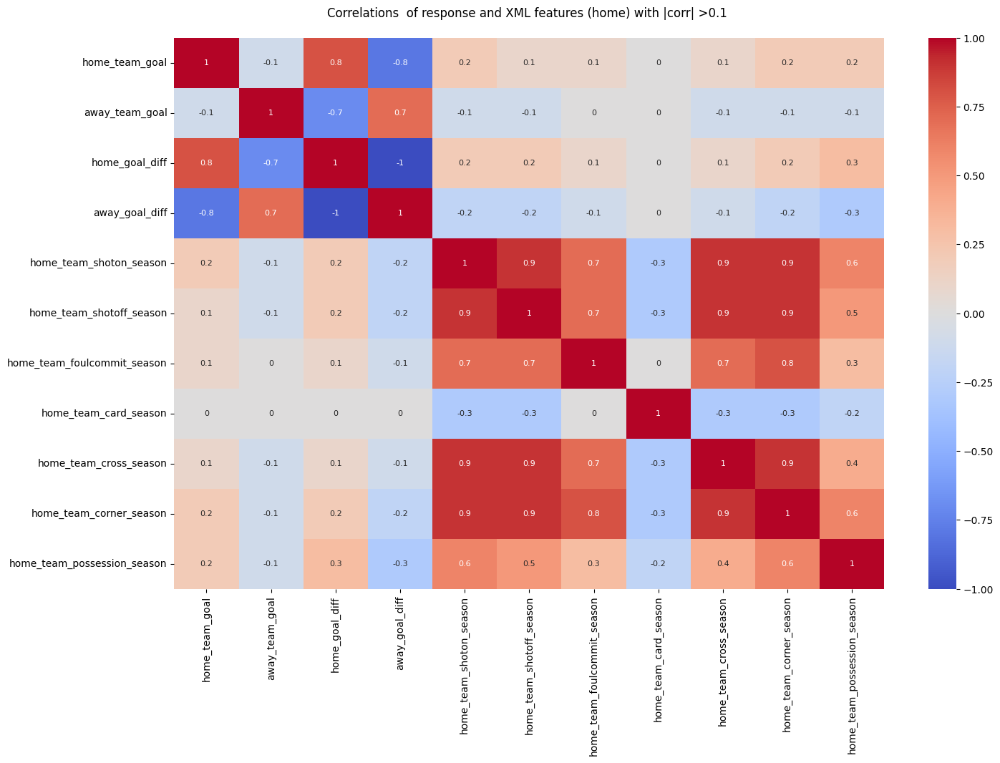

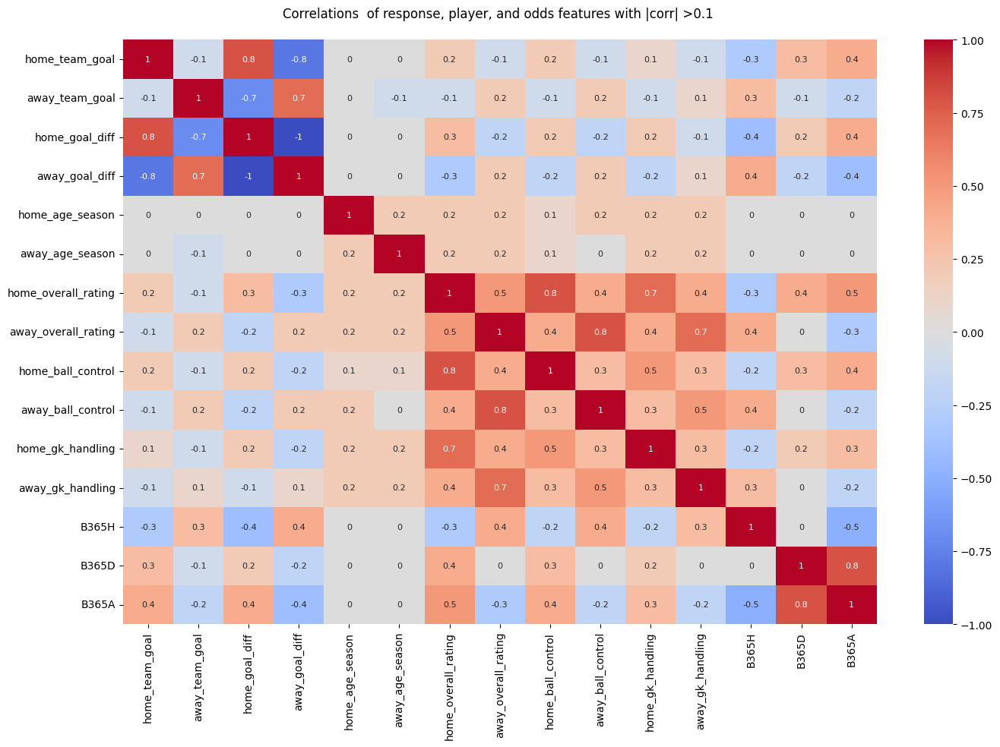

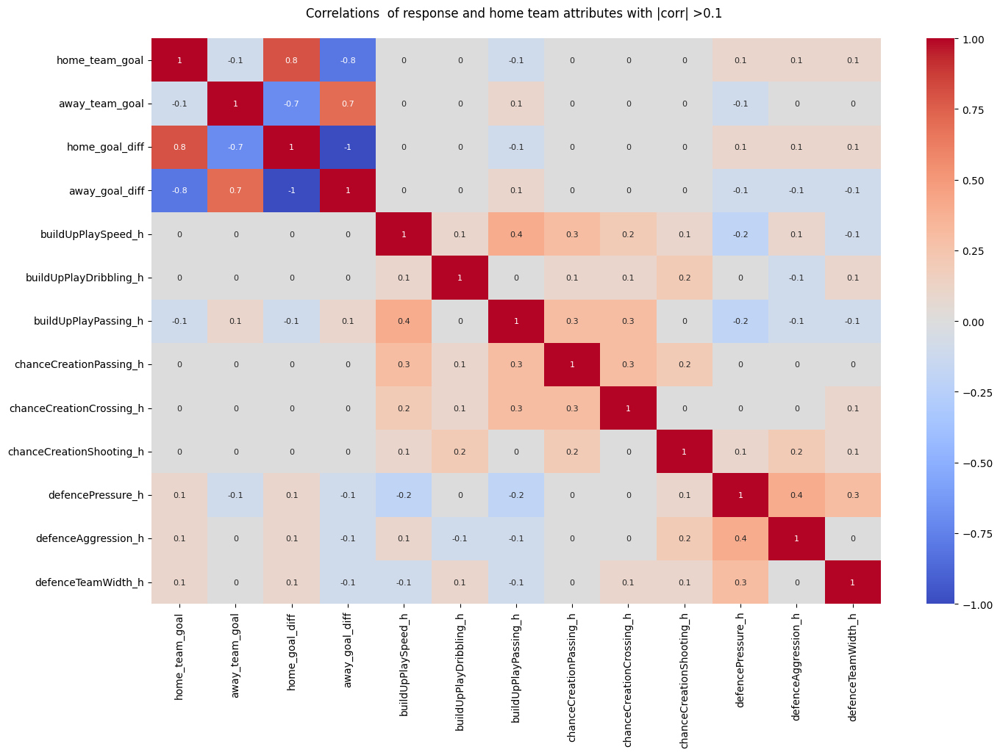

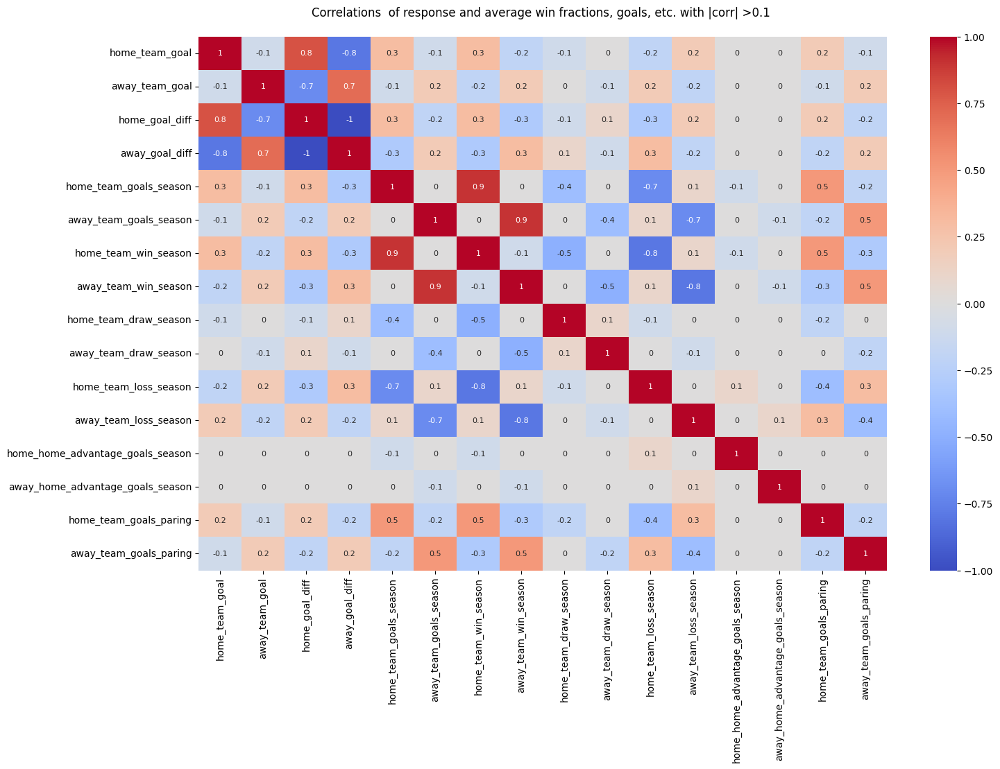

In [ ]:
df=F_match_last_results_team_player

features = [response_features + xml_features[0::2],
            response_features + player_features + odds_features,
            response_features + home_team,
            response_features + average_win_goals]



abs_cut_off = 0.1

titles = [' of response and XML features (home) with |corr| >' + str(abs_cut_off),
          ' of response, player, and odds features with |corr| >' + str(abs_cut_off),
          ' of response and home team attributes with |corr| >' + str(abs_cut_off),
          ' of response and average win fractions, goals, etc. with |corr| >' + str(abs_cut_off)
          ]
#titles = ['of Model Features with |corr| >' + str(abs_cut_off)]

for feature, title in zip(features, titles):
    #features = list(F_match_overview.columns)
    df_corr = df[feature].select_dtypes(include=np.number).dropna().corr().round(1)
    corrplot(df_corr, abs_cut_off = abs_cut_off, fontsize = 8,
         title = title)

**response features**:

home_team_goal, home_goal_diff (away analoguously)

.

**XML-data**:

The response features have very weak (-0.3 < 0.2) correlations with XML-features.

Strong (>0.7) correlation among all xml-features except from card (>-0.3) and possession (<0.6). Card has no correlation with responses. Therefore, possession could be the only useful feature.


**Player + odds:**

Again very low correlation between responses and mean player attributes. Overall_rating is in some cases slightly more correlated.

Even higher correlation for the odd - but how early before a match are they available?

B365D and B365A are highly correlated, so one of them would be enough.
B365H is inversely correlated correlated with B365A but not with B365D. So, we could pick B365H and B365D for odds.

**Team attributes**:

The team attributes appear useless.

## Model

Collection of crass-validation methods to play with

In [ ]:
cvRK = RepeatedKFold(n_splits=5, n_repeats= 100, random_state=1)
cvSK = StratifiedKFold(n_splits=5, shuffle=False, random_state=None)
cvSKs = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

Settings for model fitting and recursive feature elimination:

In [ ]:
# for RFECV:

min_features_to_select = 1  # Minimum number of features to consider
lin_reg = LinearRegression()
log_reg = LogisticRegression(solver='newton-cg', multi_class='multinomial')
cv = cvRK #StratifiedKFold(5)


In [ ]:
# speed up on the cost of quality by reducing the data to one country
F_match_last_results_team_player_bkp = F_match_last_results_team_player
#F_match_last_results_team_player = F_match_last_results_team_player_bkp
F_match_last_results_team_player = F_match_last_results_team_player.loc[
    F_match_last_results_team_player.country.isin(['England', 'Germany'])]

### Goal Difference ~ last years' results and match history:


Settings for current model

In [ ]:
model_est = lin_reg
df = F_match_last_results_team_player
response = 'home_goal_diff'

#### Pre-selection: Iterative RFECV through feature group

Using 3016 rows for model for XML


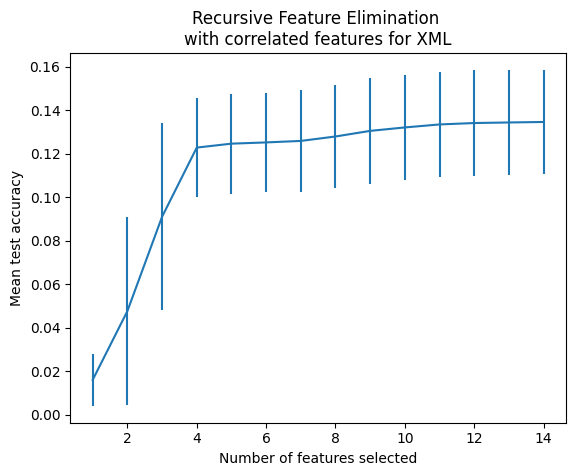

Using 5487 rows for model for odds


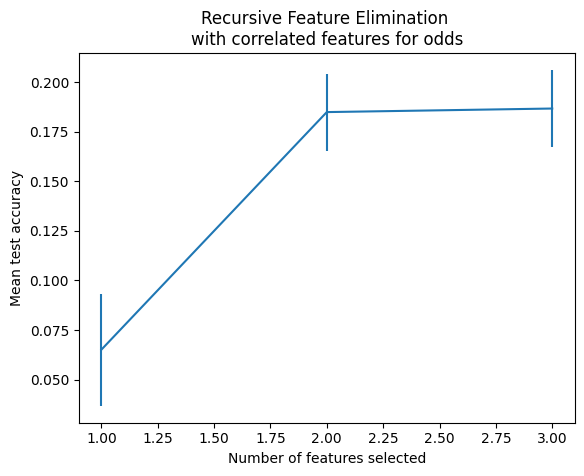

Using 3524 rows for model goals/home advantage/pairing


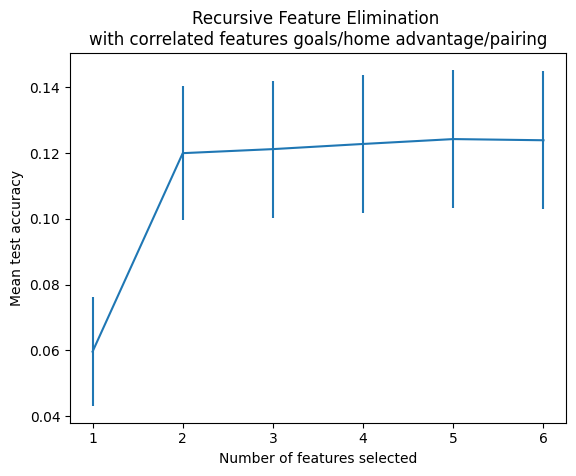

Using 3524 rows for model for win/draw/loss


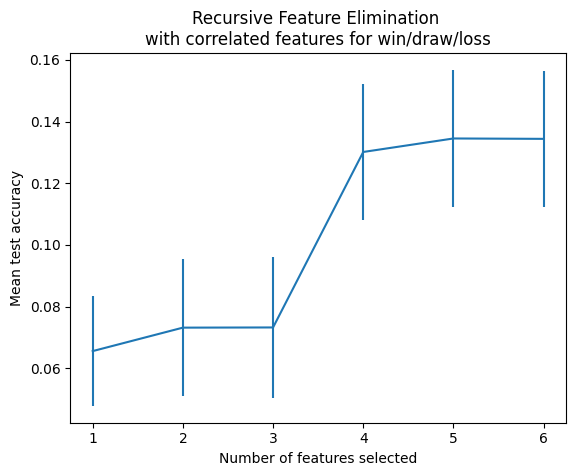

Using 1372 rows for model buildUpPlay-Speed/Dribbling/Passing


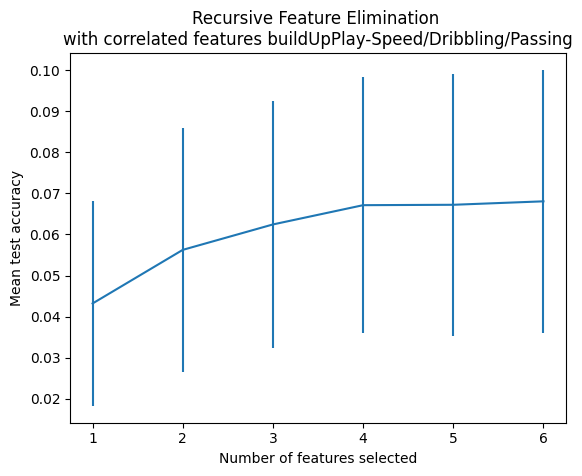

Using 4116 rows for model chanceCreation-Passing/Crossing/Shooting


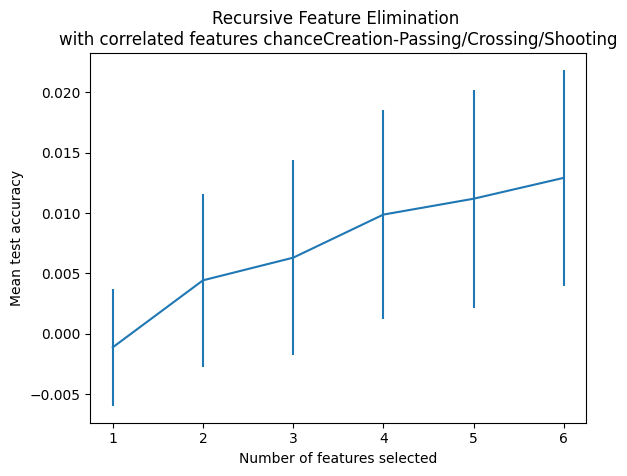

Using 4116 rows for model defence-Pressure/Aggression/TeamWidth


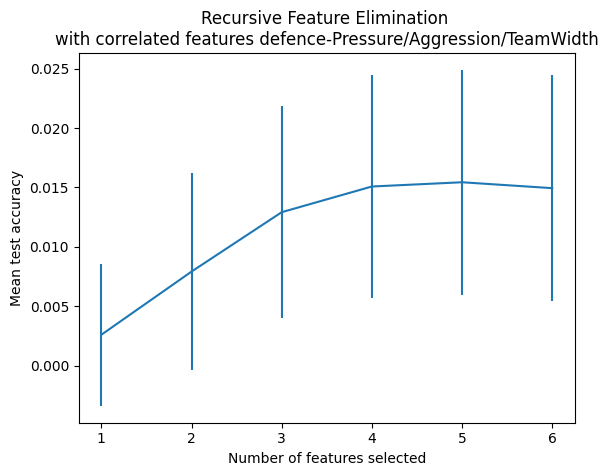

Using 5464 rows for model player attributes


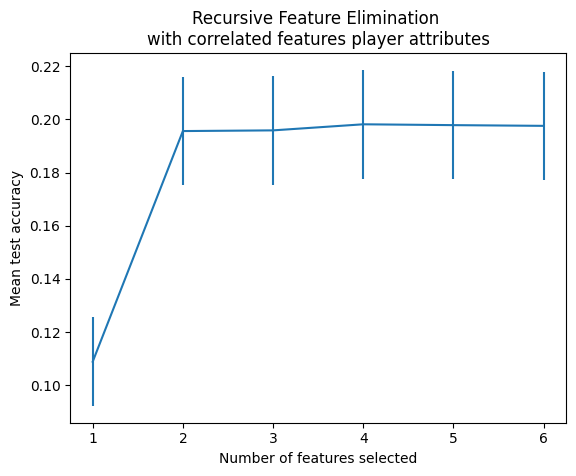

In [ ]:

feature_list = [['home_team_shoton_season', 'home_team_shotoff_season',
       'home_team_foulcommit_season', 'home_team_card_season',
       'home_team_cross_season', 'home_team_corner_season',
       'home_team_possession_season',
       'away_team_shoton_season', 'away_team_shotoff_season',
       'away_team_foulcommit_season', 'away_team_card_season',
       'away_team_cross_season', 'away_team_corner_season',
       'away_team_possession_season'],

        ['B365H', 'B365D', 'B365A',
        ],
                [
       'home_team_goals_season', 'away_team_goals_season',
       'home_home_advantage_goals_season', 'away_home_advantage_goals_season',
       'home_team_goals_paring', 'away_team_goals_paring',
       ],
                [
       'home_team_win_season', 'away_team_win_season',
       'home_team_draw_season', 'away_team_draw_season',
       'home_team_loss_season', 'away_team_loss_season',
       ],
                [
       'buildUpPlaySpeed_h', 'buildUpPlayDribbling_h', 'buildUpPlayPassing_h',
       'buildUpPlaySpeed_a', 'buildUpPlayDribbling_a', 'buildUpPlayPassing_a'
       ],
                [
       'chanceCreationPassing_h', 'chanceCreationCrossing_h', 'chanceCreationShooting_h',
       'chanceCreationPassing_a', 'chanceCreationCrossing_a', 'chanceCreationShooting_a',
       ],
                [
       'defencePressure_h', 'defenceAggression_h', 'defenceTeamWidth_h',
       'defencePressure_a', 'defenceAggression_a', 'defenceTeamWidth_a',
       ],
                [
       'home_overall_rating', 'away_overall_rating',
       'home_ball_control', 'away_ball_control',
       'home_gk_handling', 'away_gk_handling'
       ]
                ]

titles = ['for XML', 'for odds', 'goals/home advantage/pairing',
          'for win/draw/loss',  'buildUpPlay-Speed/Dribbling/Passing',
          'chanceCreation-Passing/Crossing/Shooting',
          'defence-Pressure/Aggression/TeamWidth',
          'player attributes'
          ]


pre_scores, pre_sum_features  = multi_block_RFECV(df, response, feature_list, titles = titles, model_est = model_est,
                  cv=cv, min_features_to_select = min_features_to_select)


In [ ]:
pre_scores.round(3)

,subset,sample size,mean_test_score,std_test_score,RFECVselected
0,XML,3016,0.135,0.024,"[home_team_shoton_season, home_team_shotoff_season, home_team_foulcommit_season, home_team_card_season, home_team_cross_season, home_team_corner_season, home_team_possession_season, away_team_shoton_season, away_team_shotoff_season, away_team_foulcommit_season, away_team_card_season, away_team_cross_season, away_team_corner_season, away_team_possession_season]"
1,odds,5487,0.187,0.019,"[B365H, B365D, B365A]"
2,goals/home advantage/pairing,3524,0.124,0.021,"[home_team_goals_season, away_team_goals_season, home_home_advantage_goals_season, home_team_goals_paring, away_team_goals_paring]"
3,win/draw/loss,3524,0.135,0.022,"[home_team_win_season, away_team_win_season, home_team_draw_season, away_team_draw_season, away_team_loss_season]"
4,buildUpPlay-Speed/Dribbling/Passing,1372,0.068,0.032,"[buildUpPlaySpeed_h, buildUpPlayDribbling_h, buildUpPlayPassing_h, buildUpPlaySpeed_a, buildUpPlayDribbling_a, buildUpPlayPassing_a]"
5,chanceCreation-Passing/Crossing/Shooting,4116,0.013,0.009,"[chanceCreationPassing_h, chanceCreationCrossing_h, chanceCreationShooting_h, chanceCreationPassing_a, chanceCreationCrossing_a, chanceCreationShooting_a]"
6,defence-Pressure/Aggression/TeamWidth,4116,0.015,0.009,"[defencePressure_h, defenceTeamWidth_h, defencePressure_a, defenceAggression_a, defenceTeamWidth_a]"
7,player attributes,5464,0.198,0.020,"[home_overall_rating, away_overall_rating, home_ball_control, away_ball_control]"


#### RFECV on Pre-selection

Using 3015 rows for model for the 5 highest scored feature-selection subsets


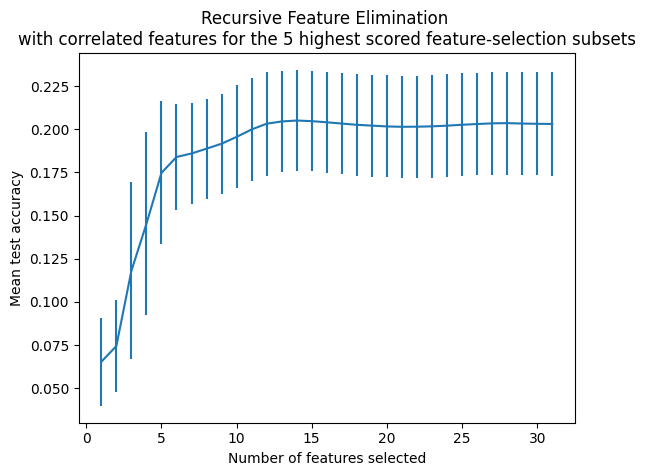

In [ ]:
pre_scores.sort_values(by = 'mean_test_score', ascending = False, inplace=True)

limit_subsets = 5
if limit_subsets > len(pre_scores):
    limit_subsets = len(pre_scores)


#feature_list = [list(x) for x in list(pre_scores['RFECVselected'][0:limit_subsets].values)
#                ]
feature_list = [np.concatenate(pre_scores['RFECVselected'][0:limit_subsets].values).tolist()]


titles = ['for the ' +str(limit_subsets)+ ' highest scored feature-selection subsets'
          ]

scores, sum_features = multi_block_RFECV(df, response, feature_list, titles = titles, model_est = model_est,
                  cv=cv, min_features_to_select = min_features_to_select)


In [ ]:
scores

,subset,sample size,mean_test_score,std_test_score,RFECVselected
0,the 5 highest scored feature-selection subsets,3015,0.205051,0.029313,"[home_overall_rating, away_overall_rating, B365H, B365D, home_team_card_season, away_team_card_season, home_team_win_season, home_team_draw_season, away_team_draw_season, away_team_loss_season, home_team_goals_season, away_team_goals_season, home_home_advantage_goals_season, home_team_goals_paring]"


It seems that the (R-quared?) score of 0.205 is the limit for a linear model.

#### Statsmodel check

In [ ]:
sum_features

array(['home_overall_rating', 'away_overall_rating', 'B365H', 'B365D',
       'home_team_card_season', 'away_team_card_season',
       'home_team_win_season', 'home_team_draw_season',
       'away_team_draw_season', 'away_team_loss_season',
       'home_team_goals_season', 'away_team_goals_season',
       'home_home_advantage_goals_season', 'home_team_goals_paring'],
      dtype='<U32')

In [ ]:
df = F_match_last_results_team_player

RFECV_Features = sum_features

RFECV_Features = ['home_overall_rating', 'away_overall_rating', #'B365H', 'B365D',
       'home_team_foulcommit_season',
                  'home_team_card_season',
       'away_team_shotoff_season', 'away_team_card_season',
       'away_team_corner_season',
                  'home_team_win_season',
       'away_team_win_season',
                  'home_team_draw_season',
       'away_team_draw_season', 'away_team_loss_season',
       'home_team_goals_season', 'away_team_goals_season',
       'home_team_goals_paring', 'away_team_goals_paring'
       ]

# include 'home_team_api_id' to accomodate for a potential use of GEE

df = df[np.concatenate([RFECV_Features,[response], ['home_team_api_id']])].dropna()

X = df[np.concatenate([RFECV_Features, ['home_team_api_id']])]
#X = df[RFECV_Features]
y = df[response].to_frame()

trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.2)

cluster_trainX = trainX['home_team_api_id']

trainX.drop(['home_team_api_id'], axis=1, inplace=True)
testX.drop(['home_team_api_id'], axis=1, inplace=True)

trainx = sm.add_constant(trainX, prepend = False)
testx = sm.add_constant(testX, prepend = False)

OLS_mod = sm.OLS(trainY, trainx)
OLS_fit = OLS_mod.fit()

print(OLS_fit.summary())

                            OLS Regression Results                            
Dep. Variable:         home_goal_diff   R-squared:                       0.212
Model:                            OLS   Adj. R-squared:                  0.207
Method:                 Least Squares   F-statistic:                     50.15
Date:                Wed, 25 Sep 2024   Prob (F-statistic):          1.31e-132
Time:                        13:00:13   Log-Likelihood:                -5460.6
No. Observations:                2819   AIC:                         1.095e+04
Df Residuals:                    2803   BIC:                         1.105e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
home_overall_ratin

Actually, we have a longitudinal data set and require a marginal regression fit to get the standard errors and p-values correct:

In [ ]:
GEE_mod = sm.GEE(trainY, trainx, groups=cluster_trainX)
GEE_fit = GEE_mod.fit()

print(GEE_fit.summary())

                               GEE Regression Results                              
Dep. Variable:              home_goal_diff   No. Observations:                 2819
Model:                                 GEE   No. clusters:                       47
Method:                        Generalized   Min. cluster size:                   9
                      Estimating Equations   Max. cluster size:                 100
Family:                           Gaussian   Mean cluster size:                60.0
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Wed, 25 Sep 2024   Scale:                           2.836
Covariance type:                    robust   Time:                         13:00:13
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
home_overall_rating             0.2220      0.018   

The p-values have only mildly changed in most cases, except from the intercept. Nevertheless, the significance of the features has not changes.
Unfortunately, I could not get the statsmodels GEE into a pipeline, so that the following feature selection and model validation is done with an OLS model.

Doas standardization change anything?

In [ ]:
pipeline = Pipeline([
  ('scale', StandardScaler()),
  #("regressor", SMWrapper(sm.GEE, groups=df['home_team_api_id']))
  #("regressor", RFECV(estimator=model_est, step=1, cv=cv,
  #      min_features_to_select=min_features_to_select, n_jobs=2)),
  ("regressor", SMWrapper(sm.OLS))
  ])
pipeline.fit(trainX, trainY)

regressor = pipeline._final_estimator

print(regressor.results_.summary())

                            OLS Regression Results                            
Dep. Variable:         home_goal_diff   R-squared:                       0.212
Model:                            OLS   Adj. R-squared:                  0.207
Method:                 Least Squares   F-statistic:                     50.15
Date:                Wed, 25 Sep 2024   Prob (F-statistic):          1.31e-132
Time:                        13:00:13   Log-Likelihood:                -5460.6
No. Observations:                2819   AIC:                         1.095e+04
Df Residuals:                    2803   BIC:                         1.105e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3955      0.032     12.473      0.0

#### RFE with OLS fit parameters (standardized data):

Standardization changes not much about the p-values.
Let's create a function that finds the best features (via RFE) and their scores for a fixed number of features. Iterate over the number of fixed features till 'max_features_to_select'.

In [ ]:
overview = quick_RFE(trainX, trainY, model_est=None, max_features_to_select= 10)

In [ ]:
overview.columns

Index(['F_stat', 'R2', 'R2_adj', 'p_v_signif', 'n_signif', 'n_insignif', 'AIC',
       'CN', 'p_val_coeff', 'selected_features'],
      dtype='object')

In [ ]:
overview_sort = overview.sort_values(by=['n_signif', 'n_insignif', 'F_stat', 'R2', 'AIC', 'CN'],
                     ascending = [False, True, False, False, True, True])
overview_sort.loc[overview_sort.CN<10000]

,F_stat,R2,R2_adj,p_v_signif,n_signif,n_insignif,AIC,CN,p_val_coeff,selected_features
2,249.1,0.210,0.209,"[1, 1, 1, 1]",4,0,10935.5,1.3,"[0.0, 0.0, 0.0, 0.04]","[home_overall_rating, away_overall_rating, home_team_draw_season]"
3,186.8,0.210,0.209,"[1, 1, 1, 0, 1]",4,1,10937.5,2.8,"[0.0, 0.0, 0.0, 0.942, 0.04]","[home_overall_rating, away_overall_rating, away_team_win_season, home_team_draw_season]"
4,149.7,0.210,0.209,"[1, 1, 1, 0, 1, 0]",4,2,10938.4,4.4,"[0.0, 0.0, 0.0, 0.507, 0.037, 0.294]","[home_overall_rating, away_overall_rating, away_team_win_season, home_team_draw_season, away_team_goals_season]"
5,124.7,0.210,0.208,"[1, 1, 1, 0, 1, 0, 0]",4,3,10940.3,5.1,"[0.0, 0.0, 0.0, 0.654, 0.04, 0.777, 0.317]","[home_overall_rating, away_overall_rating, away_team_win_season, home_team_draw_season, away_team_draw_season, away_team_goals_season]"
6,107.0,0.210,0.208,"[1, 1, 1, 0, 0, 0, 0, 0]",3,5,10941.5,5.1,"[0.0, 0.0, 0.0, 0.637, 0.081, 0.798, 0.363, 0.258]","[home_overall_rating, away_overall_rating, away_team_win_season, home_team_draw_season, away_team_draw_season, home_team_goals_season, away_team_goals_season]"
7,93.7,0.211,0.208,"[1, 1, 1, 0, 0, 0, 0, 0, 0]",3,6,10942.6,5.3,"[0.0, 0.0, 0.0, 0.34, 0.75, 0.078, 0.724, 0.333, 0.253]","[home_overall_rating, away_overall_rating, away_team_card_season, away_team_win_season, home_team_draw_season, away_team_draw_season, home_team_goals_season, away_team_goals_season]"
8,83.4,0.211,0.208,"[1, 1, 1, 0, 0, 0, 0, 0, 0, 0]",3,7,10943.7,5.3,"[0.0, 0.0, 0.0, 0.367, 0.295, 0.748, 0.083, 0.731, 0.283, 0.233]","[home_overall_rating, away_overall_rating, home_team_card_season, away_team_card_season, away_team_win_season, home_team_draw_season, away_team_draw_season, home_team_goals_season, away_team_goals_season]"
9,75.1,0.211,0.208,"[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]",3,8,10944.8,5.6,"[0.0, 0.0, 0.0, 0.33, 0.319, 0.751, 0.081, 0.737, 0.289, 0.322, 0.345]","[home_overall_rating, away_overall_rating, home_team_card_season, away_team_card_season, away_team_win_season, home_team_draw_season, away_team_draw_season, home_team_goals_season, away_team_goals_season, away_team_goals_paring]"
0,12.8,0.005,0.004,"[1, 1]",2,0,11582.5,1.0,"[0.0, 0.0]",[home_team_draw_season]
1,183.7,0.115,0.115,"[1, 1, 0]",2,1,11251.5,1.3,"[0.0, 0.0, 0.215]","[home_overall_rating, home_team_draw_season]"


#### Prediction

I choose the combination with highest pseudo R-quared and highest number of significant features and lowest number of insignificant features:

In [ ]:
df = F_match_last_results_team_player

RFE_Features = overview.loc[(overview.n_signif == 4) & (overview.n_insignif == 1)]['selected_features'].values.tolist()[0]

df = df[np.concatenate([RFE_Features,[response]])].dropna()

X = df[RFE_Features]
y = df[response].to_frame()

trainXf, testXf, trainYf, testYf = train_test_split(X, y, test_size = 0.2)

In [ ]:
lin_reg.fit(trainXf, trainYf)
y_pred = lin_reg.predict(testXf)

In [ ]:
accuracy = mean_squared_error(testYf, y_pred).round(3)
print('The mean squared error of our model is', accuracy)

The mean squared error of our model is 3.105


In [ ]:
#print('Accuracy: {:.2f}'.format(accuracy_score(testY, y_pred)))
#print('Error rate: {:.2f}'.format(1 - accuracy_score(testY, y_pred)))

In [ ]:
scoresRK = cross_val_score(lin_reg, trainXf, trainYf, cv=cvRK)
print("Accuracy in CV: %0.2f (+/- %0.2f)" % (scoresRK.mean(), scoresRK.std() * 2))

Accuracy in CV: 0.20 (+/- 0.06)


### Win, Draw, Loss ~ last years results and match history:


Settings for current model

In [ ]:
model_est = log_reg
df = F_match_last_results_team_player
response = 'home_winner'

#### Pre-selection: Iterative RFECV through feature group

I use recursive feature elimination (with cross-validation, RFECV) to select the relevant features.
To reduce the computation time, I don't give the full set of features but chunks of features to the RFECV.

Using 3016 rows for model for XML


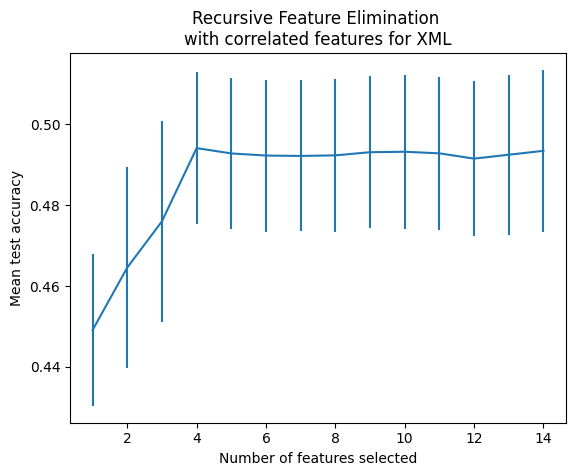

Using 5487 rows for model for odds


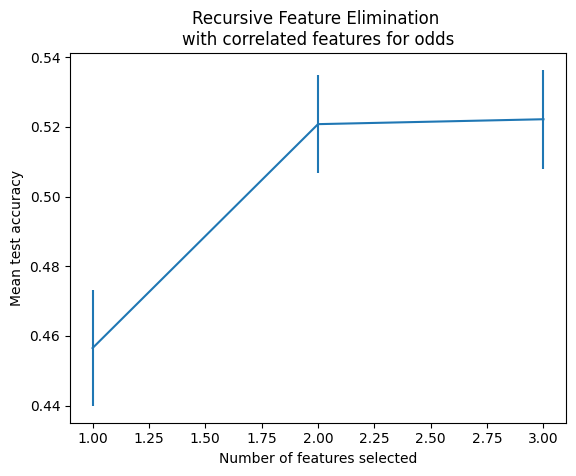

Using 3524 rows for model goals/home advantage/pairing


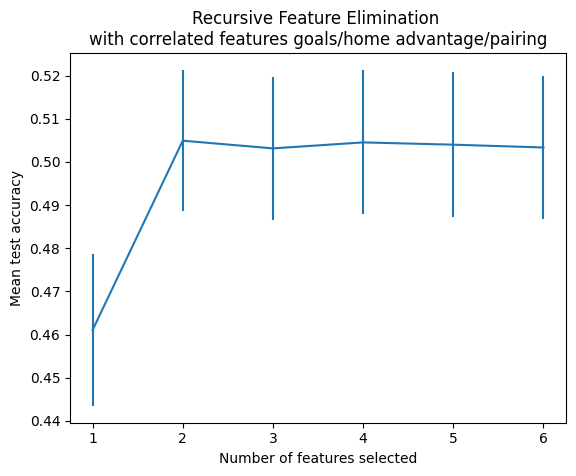

Using 3524 rows for model for win/draw/loss


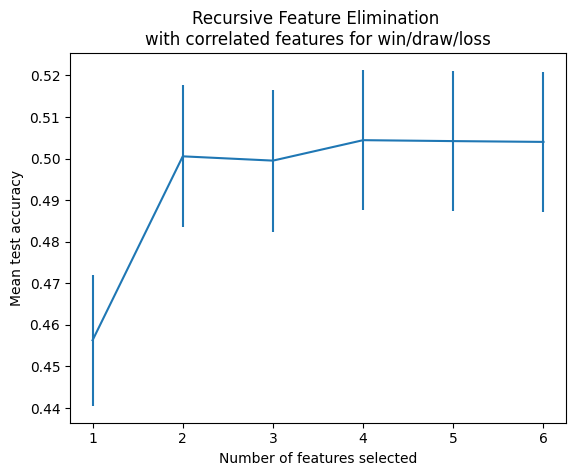

Using 1372 rows for model buildUpPlay-Speed/Dribbling/Passing


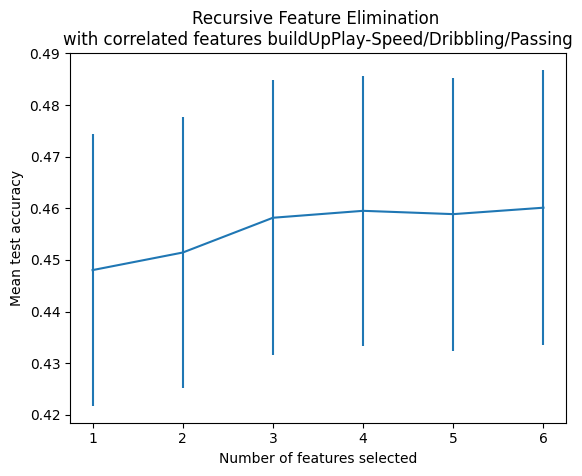

Using 4116 rows for model chanceCreation-Passing/Crossing/Shooting


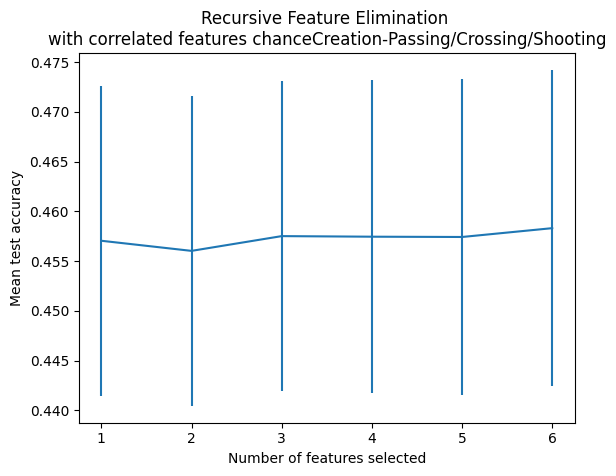

Using 4116 rows for model defence-Pressure/Aggression/TeamWidth


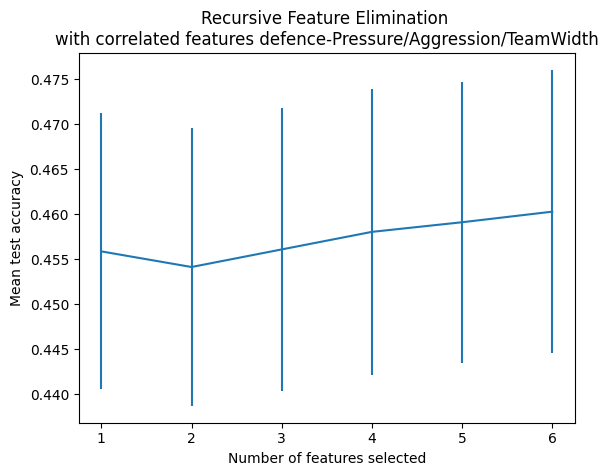

Using 5464 rows for model player attributes


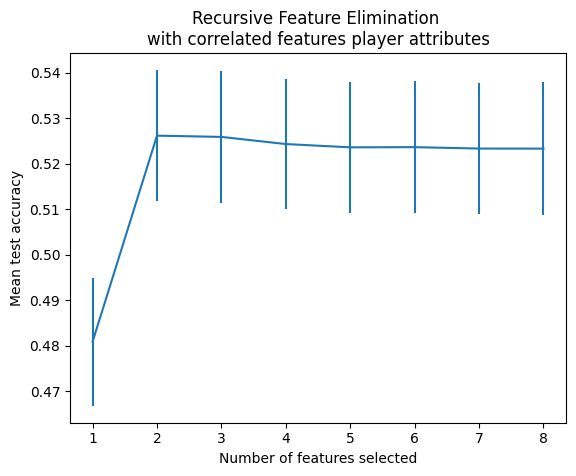

In [ ]:

feature_list = [['home_team_shoton_season', 'home_team_shotoff_season',
       'home_team_foulcommit_season', 'home_team_card_season',
       'home_team_cross_season', 'home_team_corner_season',
       'home_team_possession_season',
       'away_team_shoton_season', 'away_team_shotoff_season',
       'away_team_foulcommit_season', 'away_team_card_season',
       'away_team_cross_season', 'away_team_corner_season',
       'away_team_possession_season'],

        ['B365H', 'B365D', 'B365A',
        ],
                [
       'home_team_goals_season', 'away_team_goals_season',
       'home_home_advantage_goals_season', 'away_home_advantage_goals_season',
       'home_team_goals_paring', 'away_team_goals_paring',
       ],
                [
       'home_team_win_season', 'away_team_win_season',
       'home_team_draw_season', 'away_team_draw_season',
       'home_team_loss_season', 'away_team_loss_season',
       ],
                [
       'buildUpPlaySpeed_h', 'buildUpPlayDribbling_h', 'buildUpPlayPassing_h',
       'buildUpPlaySpeed_a', 'buildUpPlayDribbling_a', 'buildUpPlayPassing_a'
       ],
                [
       'chanceCreationPassing_h', 'chanceCreationCrossing_h', 'chanceCreationShooting_h',
       'chanceCreationPassing_a', 'chanceCreationCrossing_a', 'chanceCreationShooting_a',
       ],
                [
       'defencePressure_h', 'defenceAggression_h', 'defenceTeamWidth_h',
       'defencePressure_a', 'defenceAggression_a', 'defenceTeamWidth_a',
       ],
                [
       'home_age_season', 'away_age_season',
       'home_overall_rating', 'away_overall_rating',
       'home_ball_control', 'away_ball_control',
       'home_gk_handling', 'away_gk_handling'
       ]
                ]

titles = ['for XML', 'for odds', 'goals/home advantage/pairing',
          'for win/draw/loss',  'buildUpPlay-Speed/Dribbling/Passing',
          'chanceCreation-Passing/Crossing/Shooting',
          'defence-Pressure/Aggression/TeamWidth',
          'player attributes'
          ]


pre_scores, pre_sum_features  = multi_block_RFECV(df, response, feature_list, titles = titles, model_est = model_est,
                  cv=cv, min_features_to_select = min_features_to_select)


Let's inspect the mean test scores and the selected features:

In [ ]:
pre_scores.round(3)

,subset,sample size,mean_test_score,std_test_score,RFECVselected
0,XML,3016,0.494,0.019,"[home_team_shoton_season, home_team_card_season, away_team_card_season, away_team_corner_season]"
1,odds,5487,0.522,0.014,"[B365H, B365D, B365A]"
2,goals/home advantage/pairing,3524,0.505,0.016,"[home_team_goals_season, away_team_goals_season]"
3,win/draw/loss,3524,0.504,0.017,"[home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"
4,buildUpPlay-Speed/Dribbling/Passing,1372,0.460,0.027,"[buildUpPlaySpeed_h, buildUpPlayDribbling_h, buildUpPlayPassing_h, buildUpPlaySpeed_a, buildUpPlayDribbling_a, buildUpPlayPassing_a]"
5,chanceCreation-Passing/Crossing/Shooting,4116,0.458,0.016,"[chanceCreationPassing_h, chanceCreationCrossing_h, chanceCreationShooting_h, chanceCreationPassing_a, chanceCreationCrossing_a, chanceCreationShooting_a]"
6,defence-Pressure/Aggression/TeamWidth,4116,0.460,0.016,"[defencePressure_h, defenceAggression_h, defenceTeamWidth_h, defencePressure_a, defenceAggression_a, defenceTeamWidth_a]"
7,player attributes,5464,0.526,0.014,"[home_overall_rating, away_overall_rating]"


#### RFECV on Pre-selection

Take feature groups with the n=limit_subsets highest scores and use all of these features in one model.

Using 3523 rows for model for the 4 highest scored feature-selection subsets


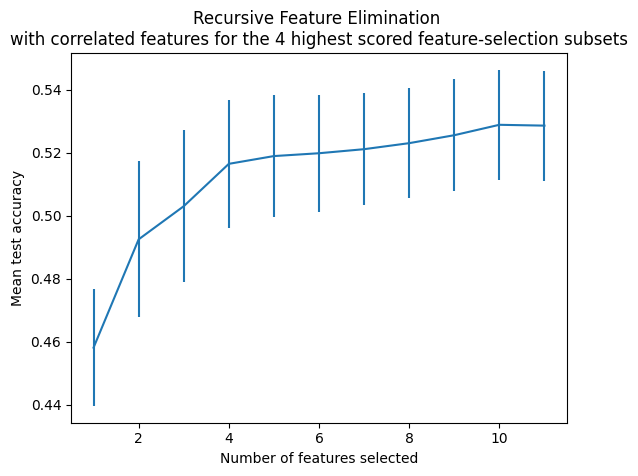

In [ ]:
pre_scores.sort_values(by = 'mean_test_score', ascending = False, inplace=True)

limit_subsets = 4
if limit_subsets > len(pre_scores):
    limit_subsets = len(pre_scores)


#feature_list = [list(x) for x in list(pre_scores['RFECVselected'][0:limit_subsets].values)
#                ]
feature_list = [np.concatenate(pre_scores['RFECVselected'][0:limit_subsets].values).tolist()]


titles = ['for the ' +str(limit_subsets)+ ' highest scored feature-selection subsets'
          ]

scores, sum_features = multi_block_RFECV(df, response, feature_list, titles = titles, model_est = model_est,
                  cv=cv, min_features_to_select = min_features_to_select)


In [ ]:
#sum_features = ['home_overall_rating', 'away_overall_rating', 'B365H', 'B365D', 'B365A']

In [ ]:
scores

,subset,sample size,mean_test_score,std_test_score,RFECVselected
0,the 4 highest scored feature-selection subsets,3523,0.528877,0.017421,"[home_overall_rating, away_overall_rating, B365H, B365D, home_team_goals_season, away_team_goals_season, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"


#### Statsmodel check

Now, check the p-values, if all features are significant.

In [ ]:
df = F_match_last_results_team_player

RFECV_Features = sum_features

df = df[np.concatenate([RFECV_Features,[response]])].dropna()

X = df[RFECV_Features]
y = df[response]

trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.2)

trainx = sm.add_constant(trainX, prepend = False)
testx = sm.add_constant(testX, prepend = False)

mnlogit_mod = sm.MNLogit(trainY, trainx)
mnlogit_fit = mnlogit_mod.fit()

print(mnlogit_fit.summary2())

Optimization terminated successfully.
         Current function value: 0.970863
         Iterations 5
                           Results: MNLogit
Model:                 MNLogit           Method:            MLE       
Dependent Variable:    home_winner       Pseudo R-squared:  0.084     
Date:                  2024-09-25 13:23  AIC:               5515.7834 
No. Observations:      2818              BIC:               5646.5466 
Df Model:              20                Log-Likelihood:    -2735.9   
Df Residuals:          2796              LL-Null:           -2987.3   
Converged:             1.0000            LLR p-value:       7.5704e-94
No. Iterations:        5.0000            Scale:             1.0000    
----------------------------------------------------------------------
   home_winner = 0      Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
----------------------------------------------------------------------
   home_overall_rating -0.1582   0.0337 -4.6876 0.0000 -0.2243 -0.0920
  

McFadden pseudo r squared: values of 0.2 to 0.4 represent good fit.
https://stats.stackexchange.com/questions/82105/mcfaddens-pseudo-r2-interpretation

Oh dear! Except from home_overall_rating no feature is significant. We have a high level of multicolinearity here among all variables except from the ratings.

Doas standardization change anything?

In [ ]:
pipeline = Pipeline([
  ('scale', StandardScaler()),
  #("regressor", SMWrapper(sm.GEE(y, x, groups=df['home_team_api_id']))
  ("regressor", SMWrapper(sm.MNLogit)) ])
pipeline.fit(trainX, trainY)

regressor = pipeline._final_estimator

print(regressor.results_.summary())

Optimization terminated successfully.
         Current function value: 0.970863
         Iterations 5
                          MNLogit Regression Results                          
Dep. Variable:            home_winner   No. Observations:                 2818
Model:                        MNLogit   Df Residuals:                     2796
Method:                           MLE   Df Model:                           20
Date:                Wed, 25 Sep 2024   Pseudo R-squ.:                 0.08416
Time:                        13:23:29   Log-Likelihood:                -2735.9
converged:                       True   LL-Null:                       -2987.3
Covariance Type:            nonrobust   LLR p-value:                 7.570e-94
home_winner=Loss       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0402      0.058      0.695      0.487      -0.073       0.154
x1         

#### RFE with MNLogit fit parameters (standardized data)

Standardization changes not much about the p-values.
Let's create a function that finds the best features (via RFE) and their scores for a fixed number of features. Iterate over the number of fixed features till 'max_features_to_select'.

In [ ]:
%%capture
overview = quick_RFE(trainX, trainY, model_est='log_reg', max_features_to_select= 10)

In [ ]:
overview_sort = overview.sort_values(by=['n_signif', 'n_insignif', 'P_R2', 'AIC'],
                     ascending = [False, True, False, True])
overview_sort#.loc[overview_sort.CN<10000]

,LLF,LLNull,LLR,LLR_p_val,P_R2,p_v_signif,n_signif,n_insignif,AIC,p_val_coeff,selected_features
0,-2904.6,-2987.3,165.3,0.0,0.028,"[1, 1]",2,0,5817.3,"[0.016, 0.005]",[home_team_loss_season]
7,-2748.3,-2987.3,478.0,0.0,0.080,"[0, 1, 1, 0, 0, 0, 0, 0, 0]",2,7,5532.5,"[0.396, 0.0, 0.001, 0.532, 0.485, 0.655, 0.668, 0.36, 0.217]","[home_overall_rating, B365H, B365D, home_team_goals_season, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"
8,-2748.0,-2987.3,478.5,0.0,0.080,"[0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",2,8,5536.1,"[0.396, 0.0, 0.001, 0.519, 0.539, 0.599, 0.661, 0.524, 0.359, 0.258]","[home_overall_rating, B365H, B365D, home_team_goals_season, away_team_goals_season, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"
9,-2735.9,-2987.3,502.8,0.0,0.084,"[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]",2,9,5515.8,"[0.487, 0.0, 0.012, 0.194, 0.125, 0.46, 0.743, 0.688, 0.35, 0.413, 0.576]","[home_overall_rating, away_overall_rating, B365H, B365D, home_team_goals_season, away_team_goals_season, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"
1,-2792.3,-2987.3,390.0,0.0,0.065,"[0, 1, 0]",1,2,5596.6,"[0.147, 0.0, 0.834]","[B365H, home_team_loss_season]"
2,-2764.1,-2987.3,446.4,0.0,0.075,"[0, 1, 0, 0]",1,3,5544.2,"[0.298, 0.0, 0.497, 0.962]","[B365H, B365D, home_team_loss_season]"
3,-2764.0,-2987.3,446.5,0.0,0.075,"[0, 1, 0, 0, 0]",1,4,5548.0,"[0.298, 0.0, 0.548, 0.893, 0.769]","[B365H, B365D, home_team_loss_season, away_team_loss_season]"
4,-2763.6,-2987.3,447.4,0.0,0.075,"[0, 1, 0, 0, 0, 0]",1,5,5551.2,"[0.292, 0.0, 0.536, 0.378, 0.972, 0.386]","[B365H, B365D, away_team_win_season, home_team_loss_season, away_team_loss_season]"
5,-2763.2,-2987.3,448.2,0.0,0.075,"[0, 1, 0, 0, 0, 0, 0]",1,6,5554.4,"[0.291, 0.0, 0.578, 0.884, 0.398, 0.927, 0.389]","[B365H, B365D, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"
6,-2762.9,-2987.3,448.8,0.0,0.075,"[0, 1, 0, 0, 0, 0, 0, 0]",1,7,5557.8,"[0.298, 0.0, 0.499, 0.556, 0.678, 0.374, 0.999, 0.396]","[B365H, B365D, home_team_goals_season, home_team_win_season, away_team_win_season, home_team_loss_season, away_team_loss_season]"


#### Prediction

I choose the combination with highest pseudo R-quared and highest number of significant features:

In [ ]:
df = F_match_last_results_team_player

RFE_Features = overview.loc[(overview.n_signif == 2) &
                            (overview.n_insignif == 8)]['selected_features'].values.tolist()[0]

df = df[np.concatenate([RFE_Features,[response]])].dropna()

X = df[RFE_Features]
y = df[response].to_frame()

trainXf, testXf, trainYf, testYf = train_test_split(X, y, test_size = 0.2)

In [ ]:
#log_reg = LogisticRegression(solver='newton-cg', multi_class='multinomial')
log_reg.fit(trainXf, trainYf)
y_pred = log_reg.predict(testXf)

In [ ]:
print('Accuracy: {:.2f}'.format(accuracy_score(testYf, y_pred)))
print('Error rate: {:.2f}'.format(1 - accuracy_score(testYf, y_pred)))

Accuracy: 0.51
Error rate: 0.49


In [ ]:
scoresRK = cross_val_score(log_reg, trainXf, trainYf, cv=cvRK)
print("Accuracy in CV: %0.2f (+/- %0.2f)" % (scoresRK.mean(), scoresRK.std() * 2))

Accuracy in CV: 0.53 (+/- 0.04)


In [ ]:
probs = pd.DataFrame(log_reg.predict_proba(testXf), columns=log_reg.classes_)
probs['predicted_wins'] = y_pred
probs['actual_class'] = testYf.reset_index().drop(columns='index')

probs[:10].round(3)

,Draw,Loss,Win,predicted_wins,actual_class
0,0.290,0.229,0.481,Win,Win
1,0.313,0.250,0.437,Win,Loss
2,0.278,0.271,0.451,Win,Draw
3,0.291,0.367,0.342,Loss,Loss
4,0.144,0.099,0.757,Win,Loss
5,0.293,0.191,0.516,Win,Loss
6,0.310,0.307,0.383,Win,Draw
7,0.312,0.255,0.433,Win,Draw
8,0.318,0.194,0.488,Win,Loss
9,0.254,0.190,0.556,Win,Win


In [ ]:
from sklearn.metrics import confusion_matrix
conf = confusion_matrix(testYf, y_pred)

In [ ]:
index_conf = [col+'_predict' for col in log_reg.classes_]

In [ ]:
df_conf = pd.DataFrame(conf, index=index_conf,
columns=log_reg.classes_)
df_conf

,Draw,Loss,Win
Draw_predict,0,38,129
Loss_predict,0,89,135
Win_predict,1,43,270


In [ ]:
from sklearn.metrics import classification_report

class_report = classification_report(testYf, y_pred)
print(class_report)

              precision    recall  f1-score   support

        Draw       0.00      0.00      0.00       167
        Loss       0.52      0.40      0.45       224
         Win       0.51      0.86      0.64       314

    accuracy                           0.51       705
   macro avg       0.34      0.42      0.36       705
weighted avg       0.39      0.51      0.43       705



From the Win-class, 87% are predicted correcly, while from the Loss class only ~50% are predicted correctly.

# Summary

**Player Attributes**

Overall_rating is the most useful predictor from this group.
Ball controll features are strongly correlated among each other - so if at all choose only one of them for modelling.

The gk_features can be used to classify goal keepers vs field players. Further investigation might find a way to discriminate between forward and defence player.

**Team Attributes**

They don't give useful information on the first sight, also in terms of correlations. Maybe some engineering is required.

**XML Attributes**

Possessions show a mild correlation with home_team_goals and home_goal_diff.

**Odds**

B365H and -D show a mild correlation with home_team_goals and home_goal_diff.

**Wins and goals from previous seasons**

They show a mild correlation with the responses but strong correlations among each other.


**Modelling**

I try to find a model for home_team_goals and home_goal_diff.

For this, I use RFECV to reduce the number of features. Nevertheless, the best score selection of features contains a high multicolinearity as statsmodel-based fits summarize.

The model for home_team_goals achieves an accuray of 0.52, the model for home_goals_diff only an R^2 of 0.21.

# Improvements

* deeper investigation of the features, featue engineering
* PCA on player/team attributes ---> clustering, classification
